# Prediction_of_power_consumption_PJT

## 1. Data loading

In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
!ls
!ls ./energy

Untitled.ipynb energy
sample_submission.csv test.csv              train.csv


In [76]:
base_path = "./energy/"

In [77]:
train = pd.read_csv(base_path + "train.csv", encoding='cp949')
test = pd.read_csv(base_path + "test.csv", encoding='cp949')

In [21]:
train

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19,4114.368,27.8,2.3,68.0,0.0,0.7,1.0,1.0
122396,60,2020-08-24 20,3975.696,27.3,1.2,71.0,0.0,0.0,1.0,1.0
122397,60,2020-08-24 21,3572.208,27.3,1.8,71.0,0.0,0.0,1.0,1.0
122398,60,2020-08-24 22,3299.184,27.1,1.8,74.0,0.0,0.0,1.0,1.0


In [22]:
test

,num,date_time,기온(°C),풍속(m/s),습도(%),"강수량(mm, 6시간)","일조(hr, 3시간)",비전기냉방설비운영,태양광보유
0,1,2020-08-25 00,27.8,1.5,74.0,0.0,0.0,NaN,NaN
1,1,2020-08-25 01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,2020-08-25 02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,2020-08-25 03,27.3,1.1,78.0,NaN,0.0,NaN,NaN
4,1,2020-08-25 04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
10075,60,2020-08-31 19,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10076,60,2020-08-31 20,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10077,60,2020-08-31 21,27.9,4.1,68.0,NaN,0.0,1.0,1.0
10078,60,2020-08-31 22,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 2. Data Preprocessing with EDA

- 학습 기간: 2020-06-01 00 ~ 2020-08-24 23

- 예측 기간: 2020-08-25 00 ~ 2020-08-31 23 23


<<>>

- 학습 기간: 2022-10-01 00 ~ 2022-11-02 23

- 예측 기간: 2022-11-02 21 ~ 2022-11-07 23


In [24]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122400 entries, 0 to 122399
Data columns (total 10 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   num         122400 non-null  int64  
 1   date_time   122400 non-null  object 
 2   전력사용량(kWh)  122400 non-null  float64
 3   기온(°C)      122400 non-null  float64
 4   풍속(m/s)     122400 non-null  float64
 5   습도(%)       122400 non-null  float64
 6   강수량(mm)     122400 non-null  float64
 7   일조(hr)      122400 non-null  float64
 8   비전기냉방설비운영   122400 non-null  float64
 9   태양광보유       122400 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 9.3+ MB


In [25]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10080 entries, 0 to 10079
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   num           10080 non-null  int64  
 1   date_time     10080 non-null  object 
 2   기온(°C)        3360 non-null   float64
 3   풍속(m/s)       3360 non-null   float64
 4   습도(%)         3360 non-null   float64
 5   강수량(mm, 6시간)  1680 non-null   float64
 6   일조(hr, 3시간)   3360 non-null   float64
 7   비전기냉방설비운영     2296 non-null   float64
 8   태양광보유         1624 non-null   float64
dtypes: float64(7), int64(1), object(1)
memory usage: 708.9+ KB


/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50857 (\N{HANGUL SYLLABLE YONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-pac

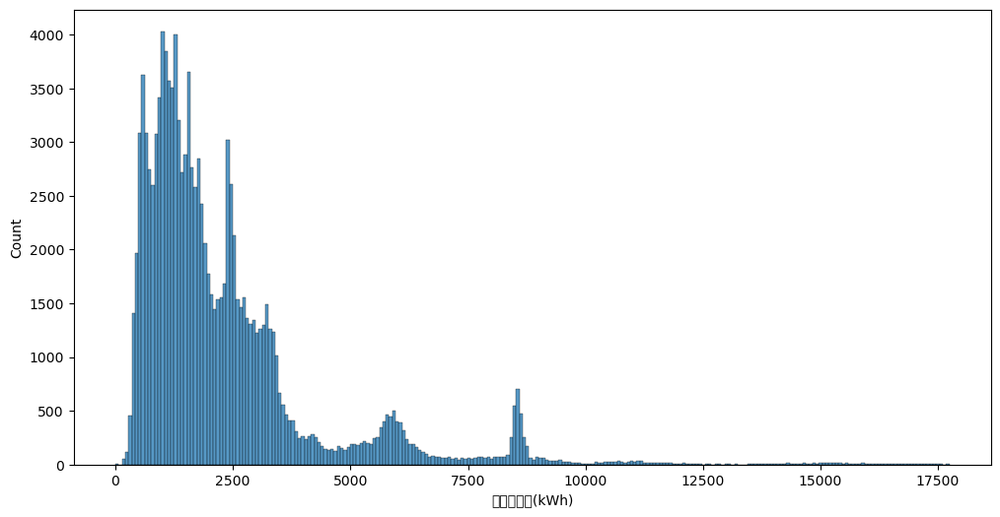

In [26]:
# 1. 결측치 확인
# 2. dtype이 object인 columns 확인
# 3. target distribution

plt.figure(figsize=(12, 6))
sns.histplot(data=train, x="전력사용량(kWh)")
plt.show()

/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50857 (\N{HANGUL SYLLABLE YONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-pac

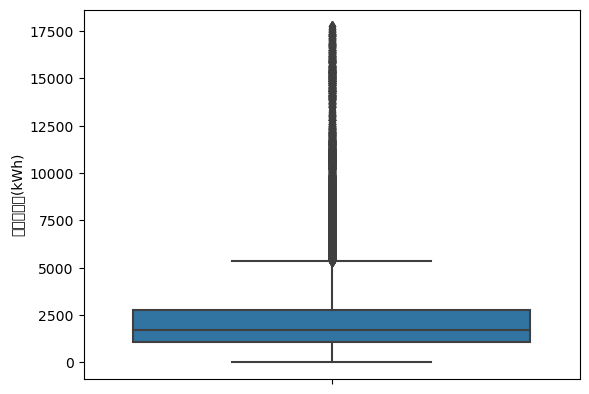

In [32]:
sns.boxplot(data=train, y="전력사용량(kWh)")
plt.show()

In [28]:
train[train["전력사용량(kWh)"] > 5500]

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
110155,54,2020-08-24 19,7130.592,29.2,1.0,72.0,0.0,0.6,1.0,0.0
110156,54,2020-08-24 20,6516.936,28.0,0.1,79.0,0.0,0.0,1.0,0.0
110157,54,2020-08-24 21,6321.888,27.6,0.1,82.0,0.0,0.0,1.0,0.0
110158,54,2020-08-24 22,6193.584,27.5,0.4,84.0,0.0,0.0,1.0,0.0


In [33]:
train[train["전력사용량(kWh)"] > 12500]

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
14294,8,2020-06-01 14,12991.52430,25.3,2.3,32.0,0.0,1.0,1.0,1.0
14295,8,2020-06-01 15,12917.37060,25.4,2.8,33.0,0.0,1.0,1.0,1.0
14296,8,2020-06-01 16,12809.80245,25.3,3.6,27.0,0.0,1.0,1.0,1.0
14342,8,2020-06-03 14,13642.90380,26.6,1.4,50.0,0.0,0.9,1.0,1.0
14343,8,2020-06-03 15,14143.04460,27.3,1.6,48.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
16313,8,2020-08-24 17,17136.35100,31.6,1.0,57.0,0.0,1.0,1.0,1.0
16314,8,2020-08-24 18,12642.34955,30.1,0.7,68.0,0.0,1.0,1.0,1.0
77245,38,2020-08-13 13,12607.56000,29.1,3.7,78.0,0.0,0.0,1.0,1.0
77246,38,2020-08-13 14,12549.60000,29.6,3.0,77.0,0.0,0.0,1.0,1.0


In [34]:
train[train["전력사용량(kWh)"] > 15000]

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
14459,8,2020-06-08 11,15177.411,27.9,1.2,53.0,0.0,1.0,1.0,1.0
14464,8,2020-06-08 16,15152.454,31.0,1.5,40.0,0.0,1.0,1.0,1.0
14482,8,2020-06-09 10,15139.800,26.7,0.9,50.0,0.0,1.0,1.0,1.0
14483,8,2020-06-09 11,15417.936,28.7,1.8,45.0,0.0,1.0,1.0,1.0
14485,8,2020-06-09 13,15177.420,30.7,1.4,36.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...
16309,8,2020-08-24 13,17423.793,31.5,2.0,56.0,0.0,1.0,1.0,1.0
16310,8,2020-08-24 14,17458.137,31.4,1.9,55.0,0.0,1.0,1.0,1.0
16311,8,2020-08-24 15,17230.671,32.1,2.1,56.0,0.0,1.0,1.0,1.0
16312,8,2020-08-24 16,17300.313,32.3,1.6,54.0,0.0,1.0,1.0,1.0


In [36]:
train[train["전력사용량(kWh)"] > 17000].shape

(40, 10)

<AxesSubplot:xlabel='num', ylabel='전력사용량(kWh)'>

/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  func(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  func(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  func(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Glyph 50857 (\N{HANGUL SYLLABLE YONG}) missing from current font.
  func(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Glyph 47049 (\N{HANGUL SYLLABLE RYANG}) missin

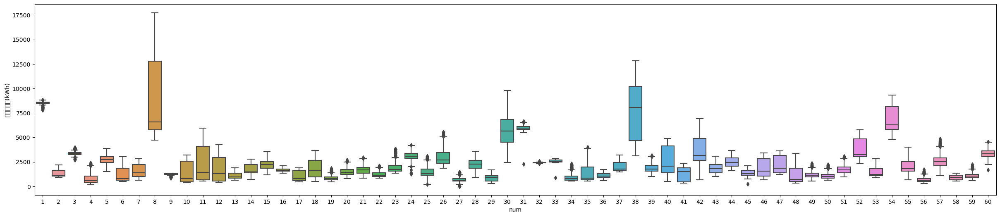

In [45]:
# 건물 별로 전력 사용량 패턴이 다름!!!
plt.figure(figsize=(30, 6))
sns.boxplot(data=train, x="num", y="전력사용량(kWh)")

In [51]:
train

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19,4114.368,27.8,2.3,68.0,0.0,0.7,1.0,1.0
122396,60,2020-08-24 20,3975.696,27.3,1.2,71.0,0.0,0.0,1.0,1.0
122397,60,2020-08-24 21,3572.208,27.3,1.8,71.0,0.0,0.0,1.0,1.0
122398,60,2020-08-24 22,3299.184,27.1,1.8,74.0,0.0,0.0,1.0,1.0


/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

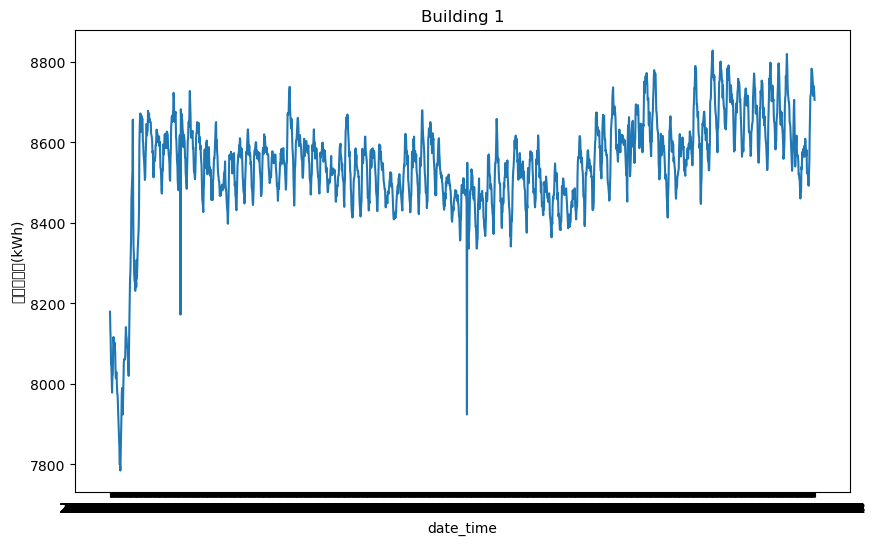

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

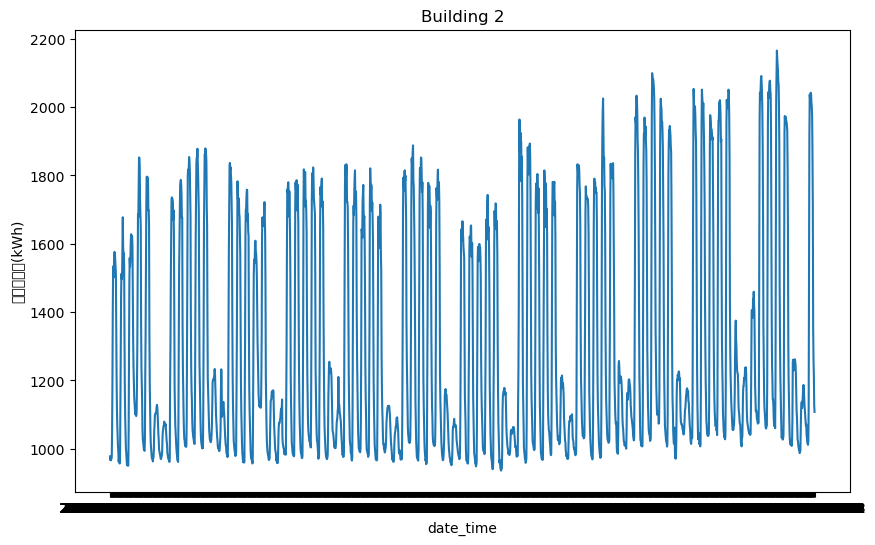

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

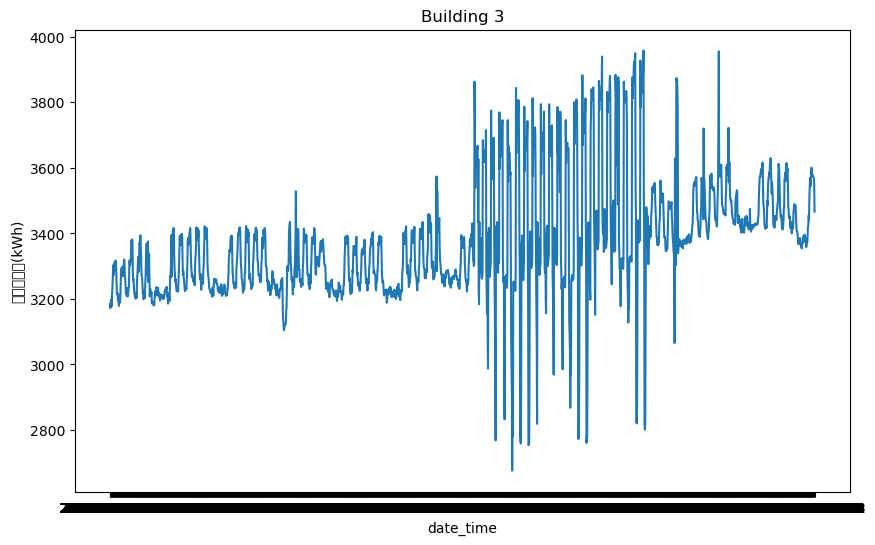

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

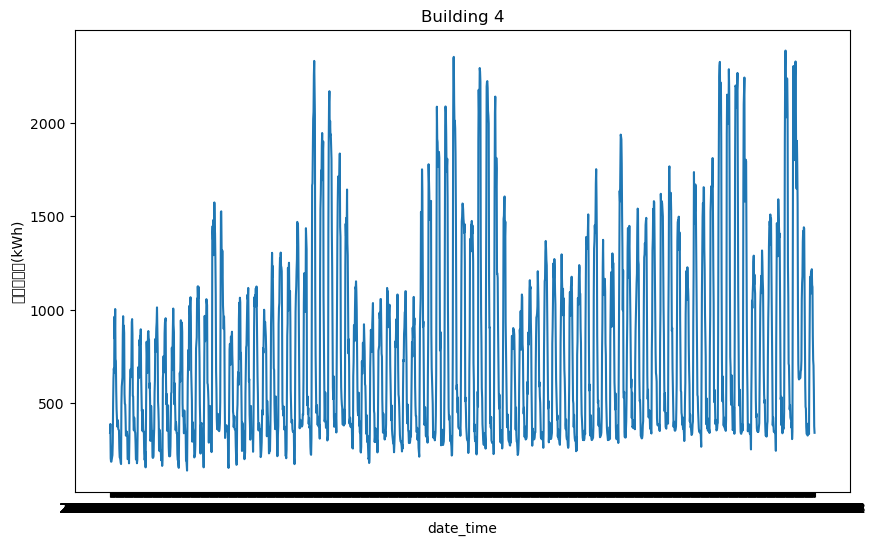

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

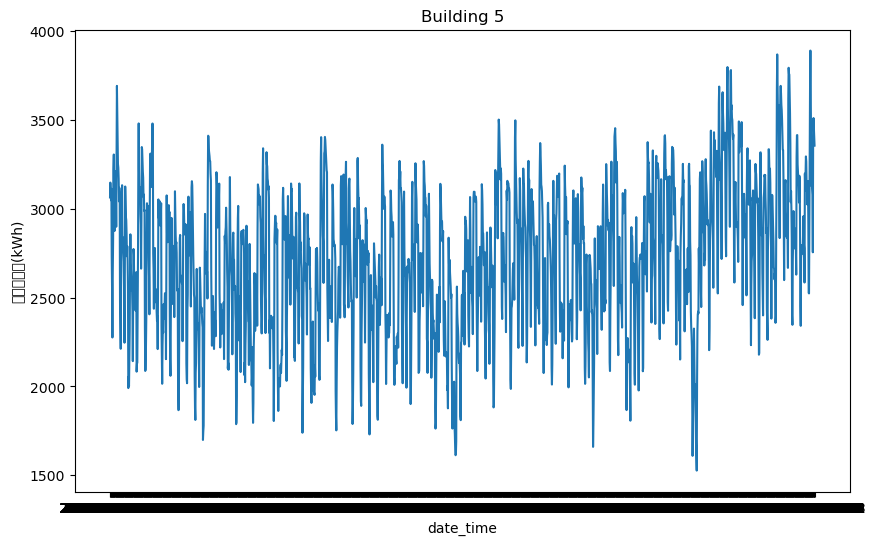

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

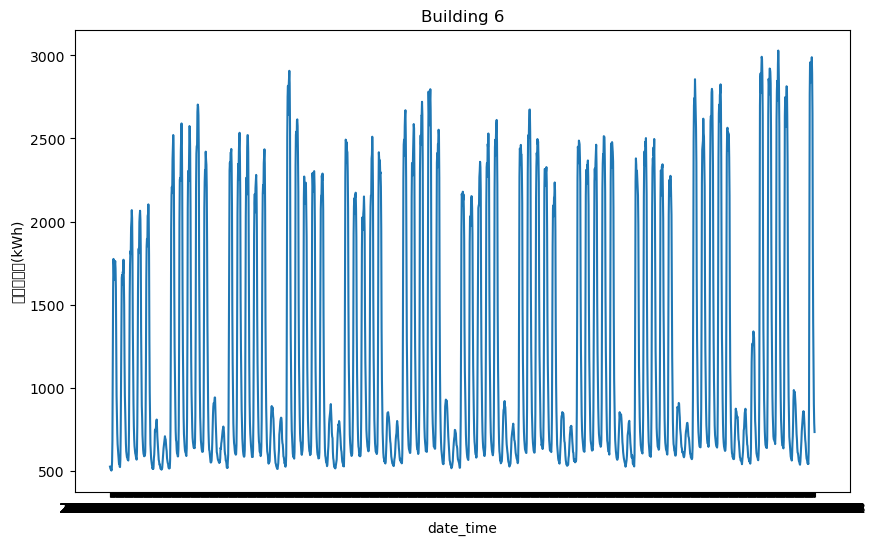

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

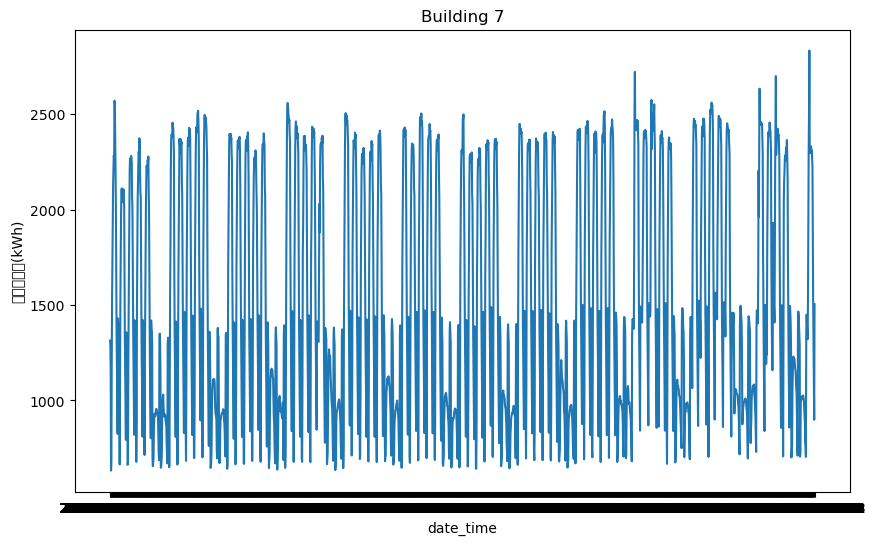

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

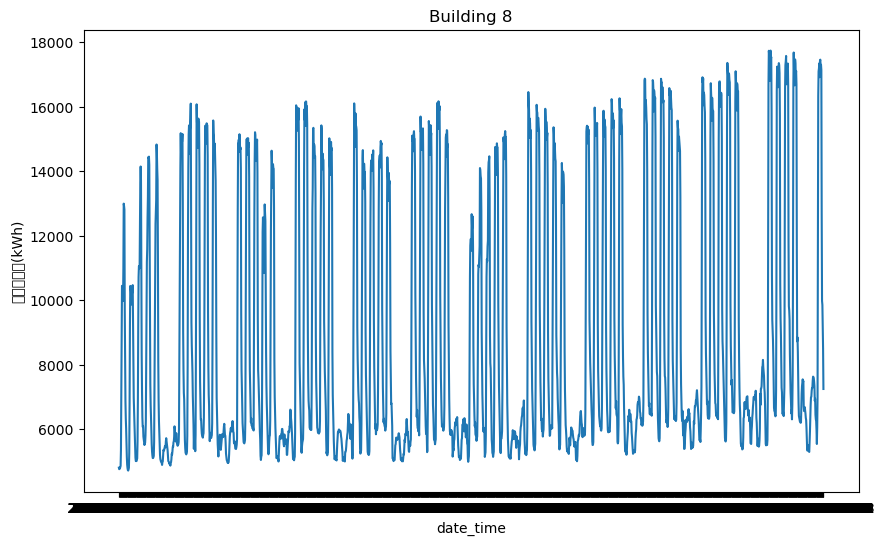

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

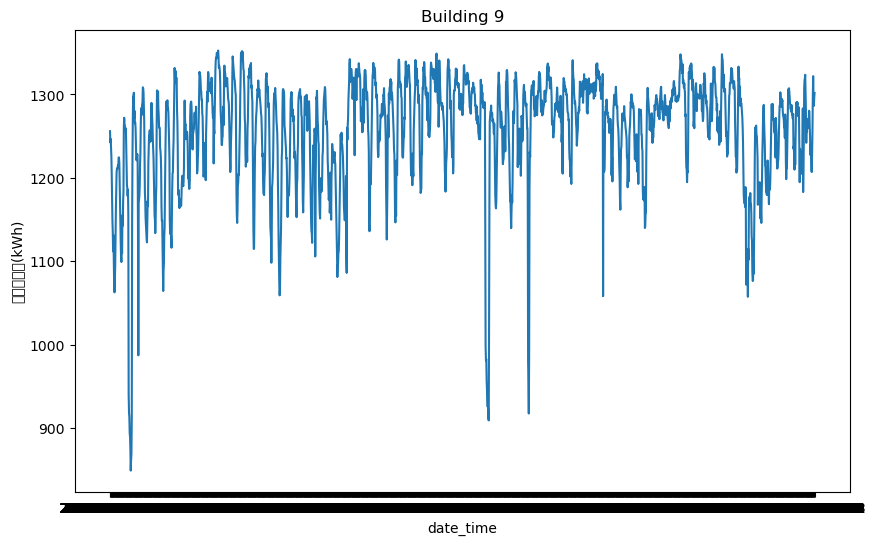

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

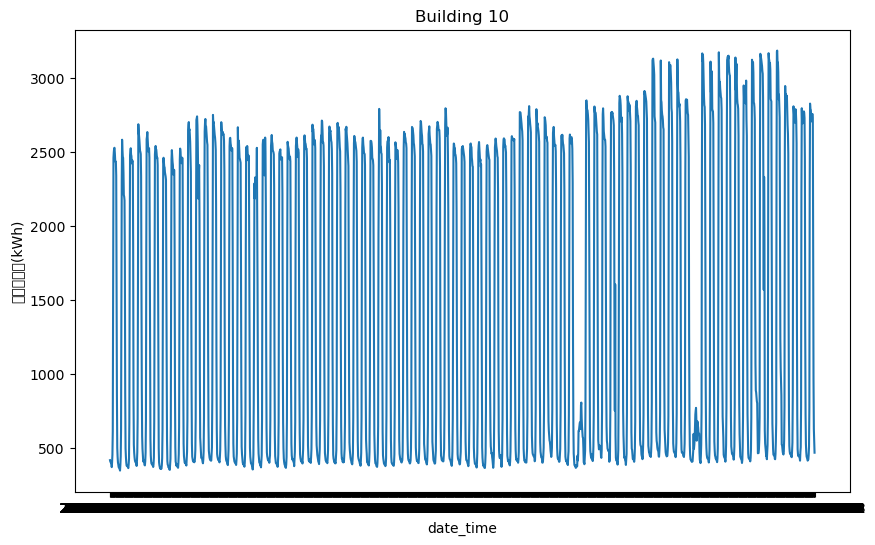

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

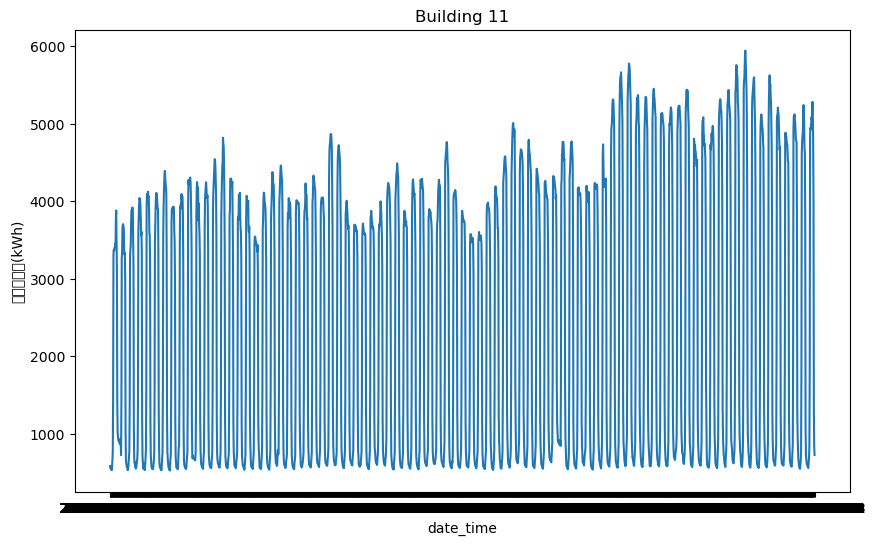

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

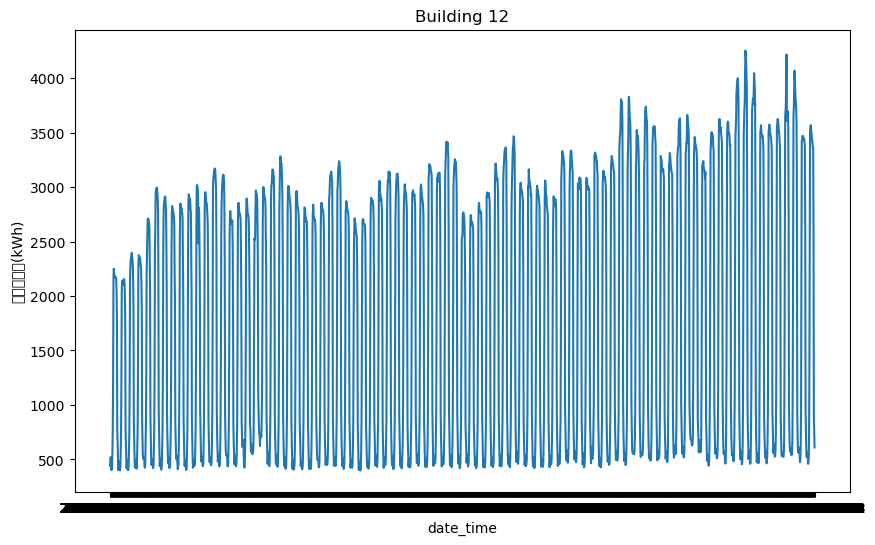

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

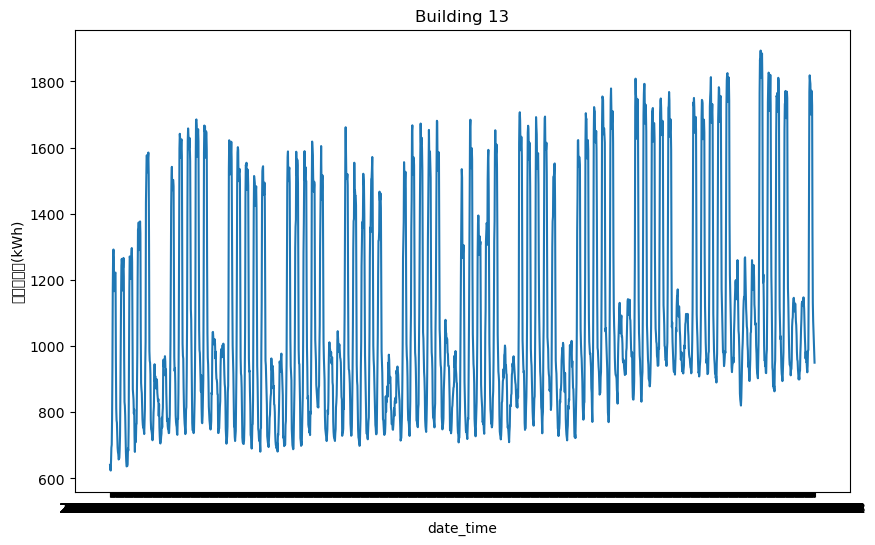

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

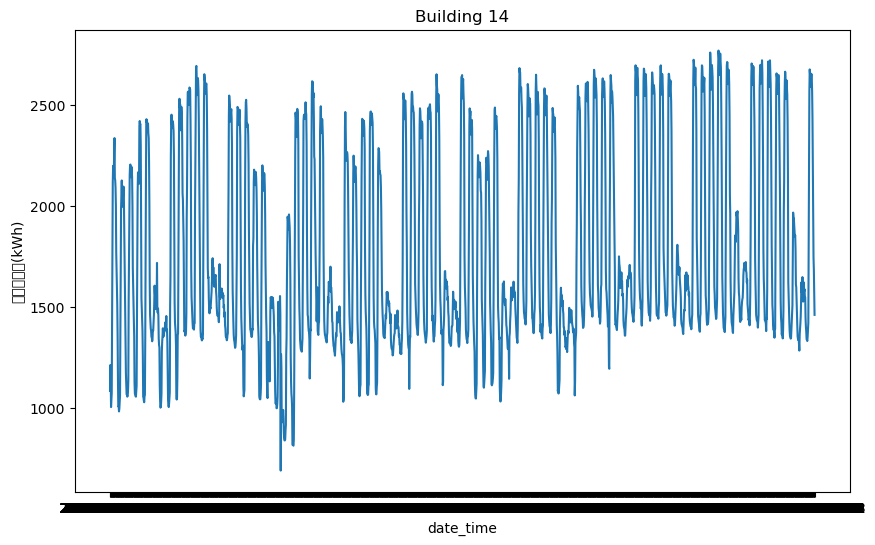

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

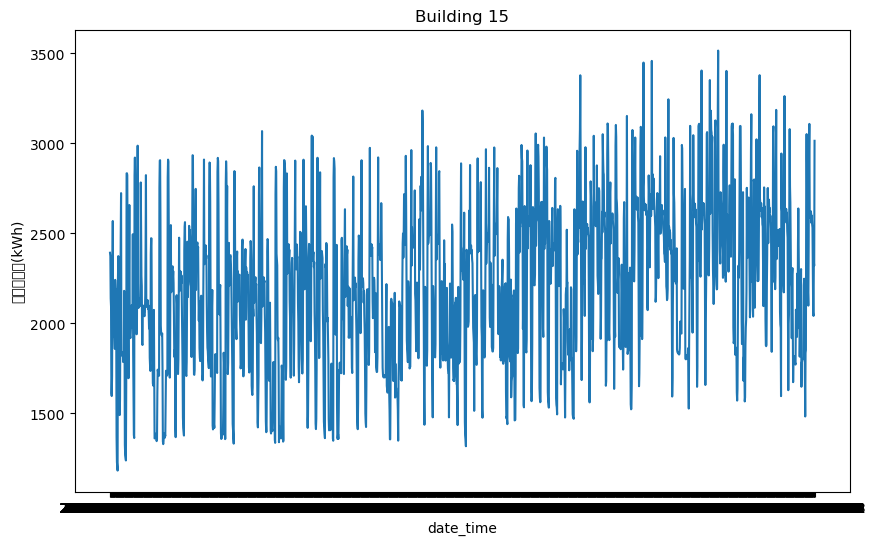

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

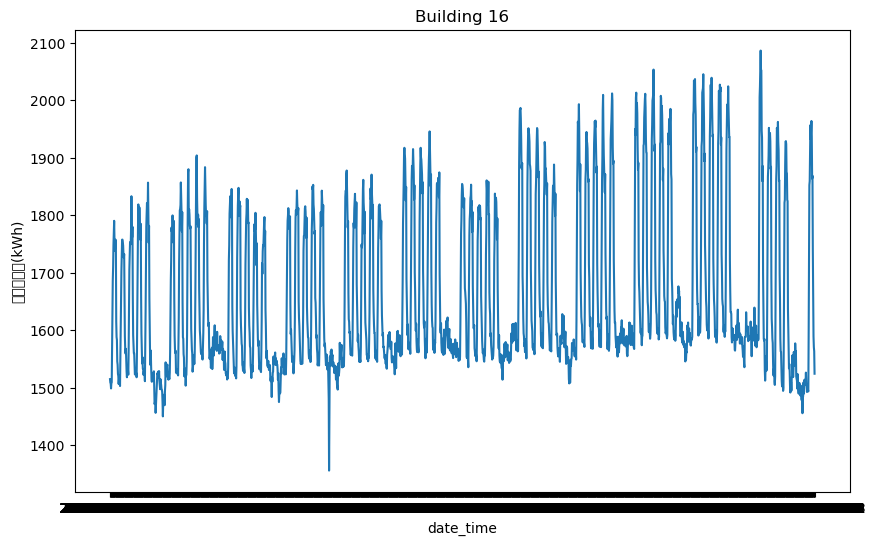

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

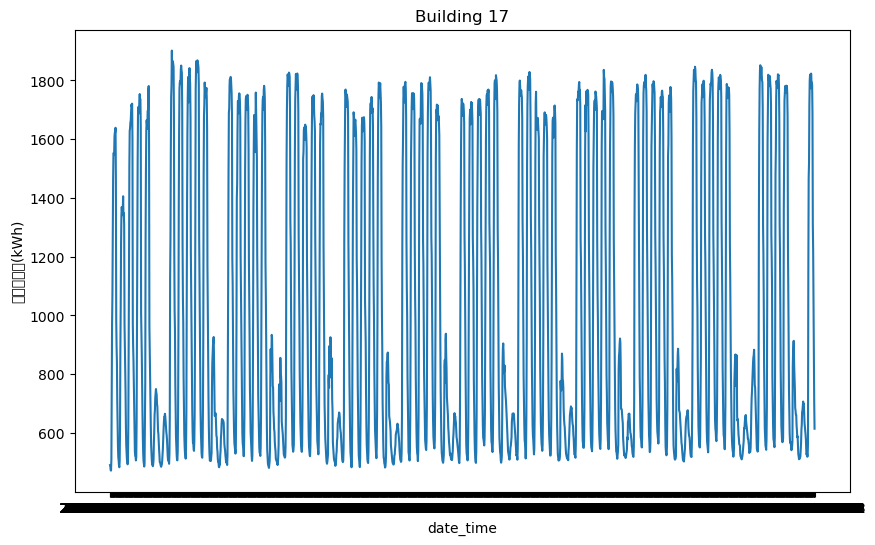

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

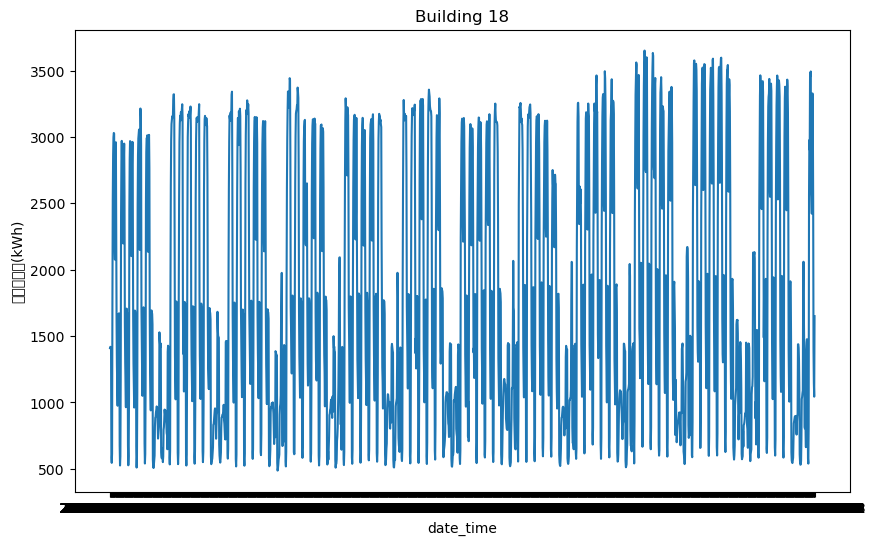

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

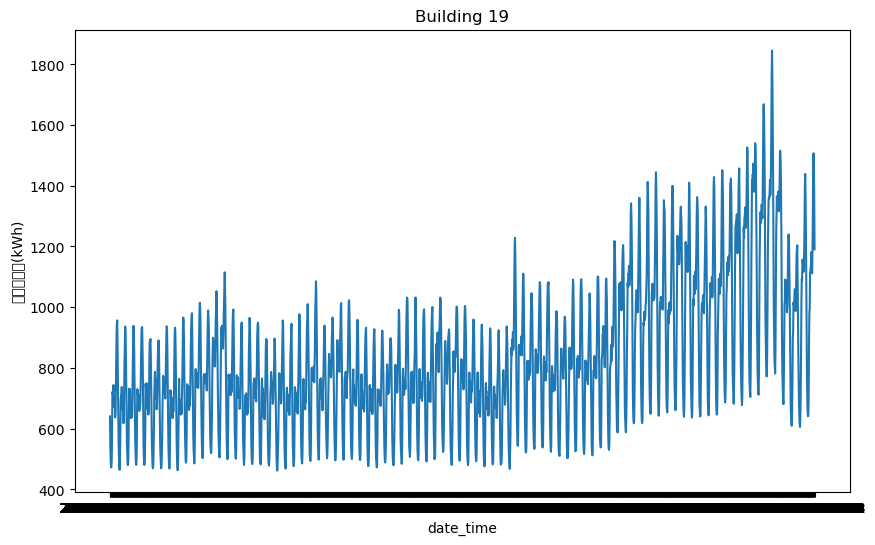

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

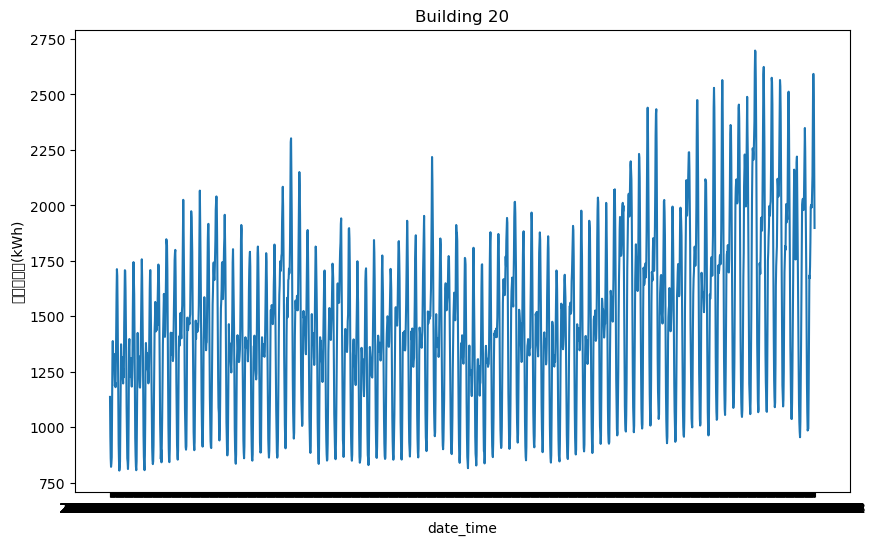

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

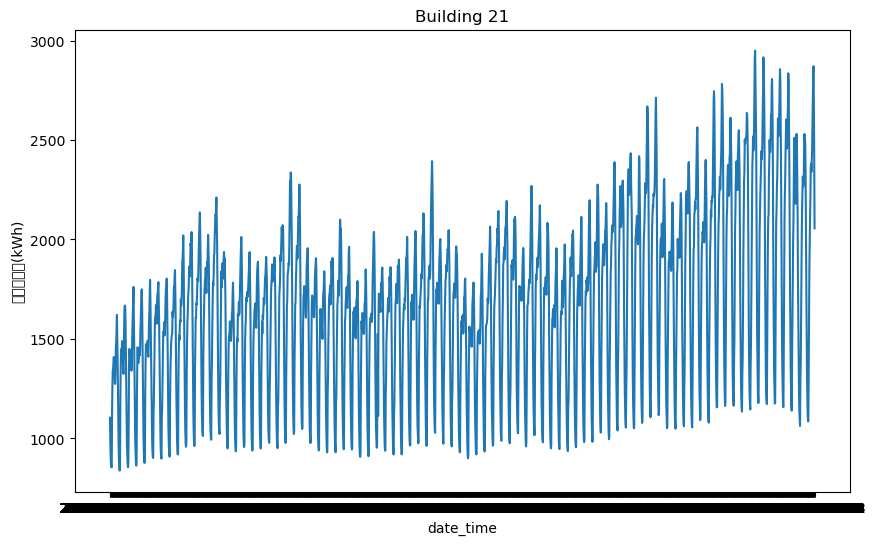

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

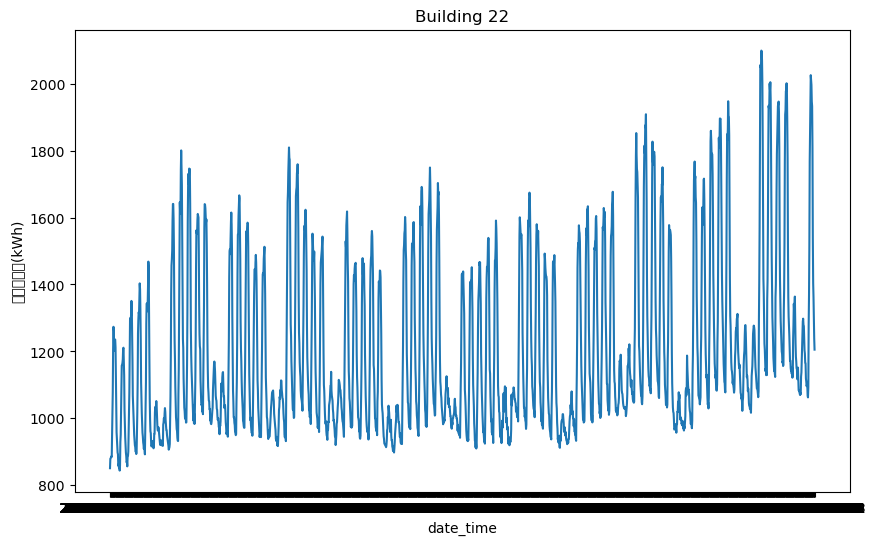

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

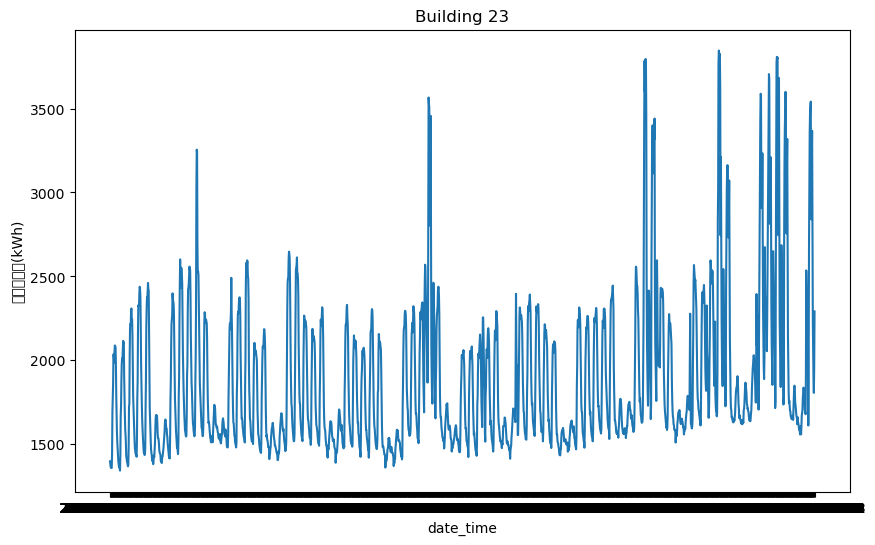

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

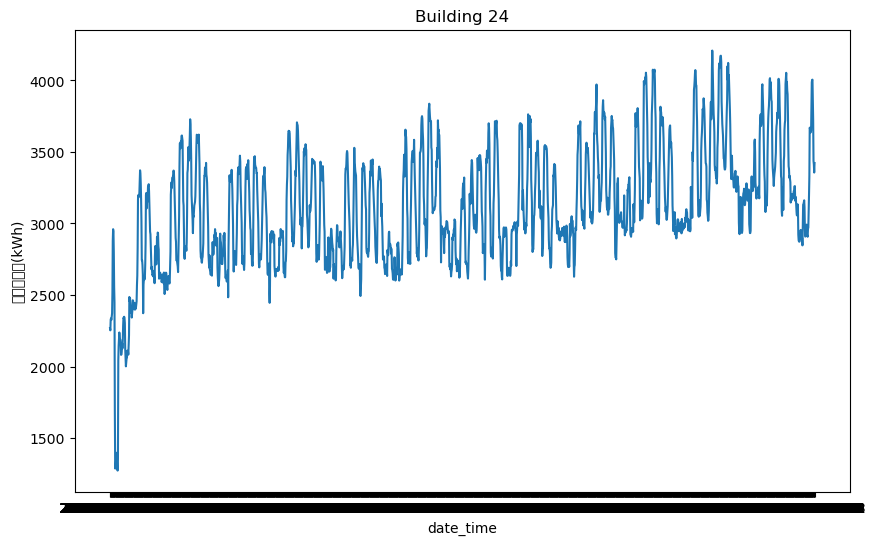

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

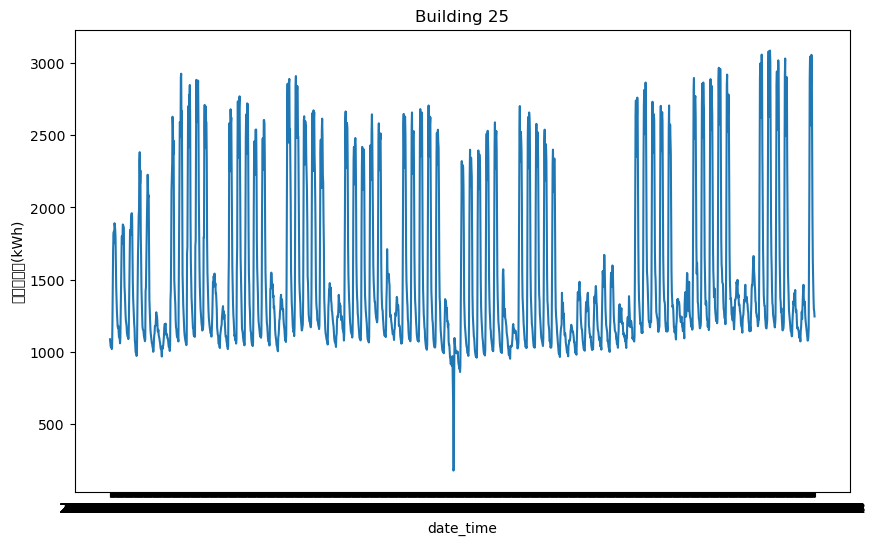

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

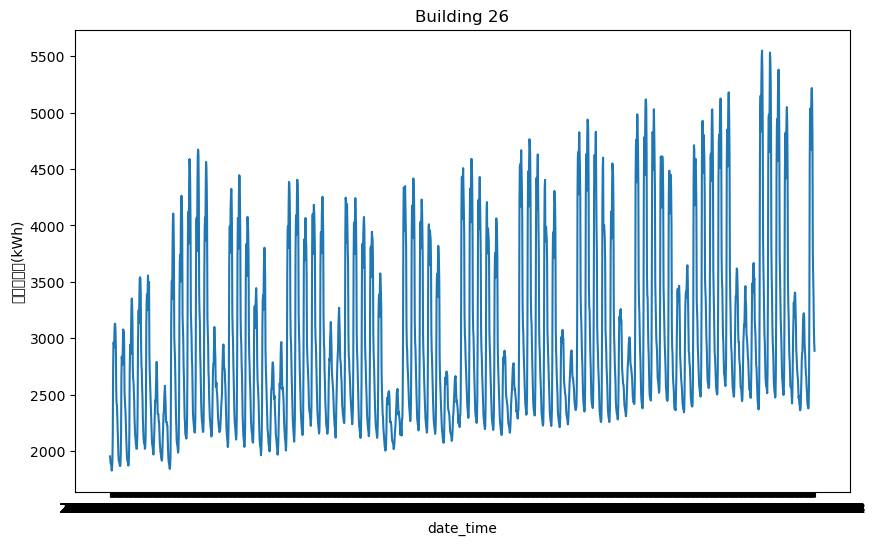

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

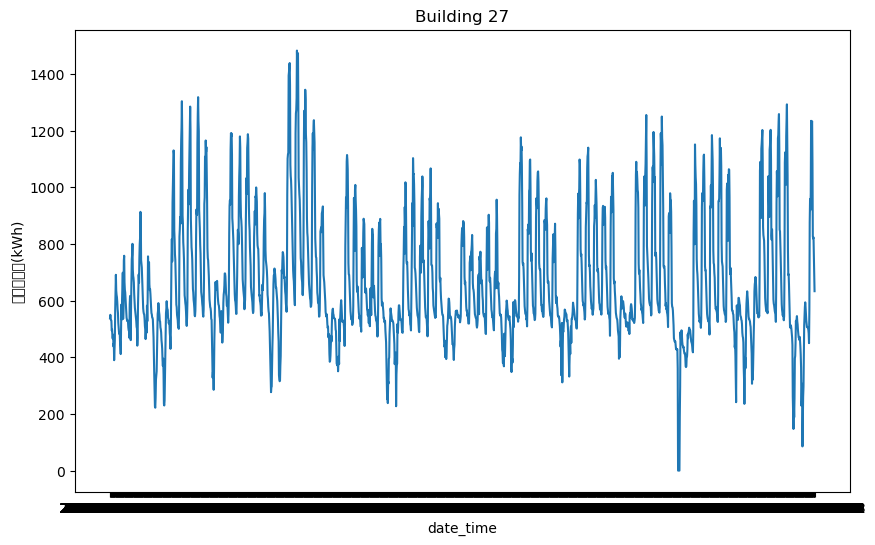

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

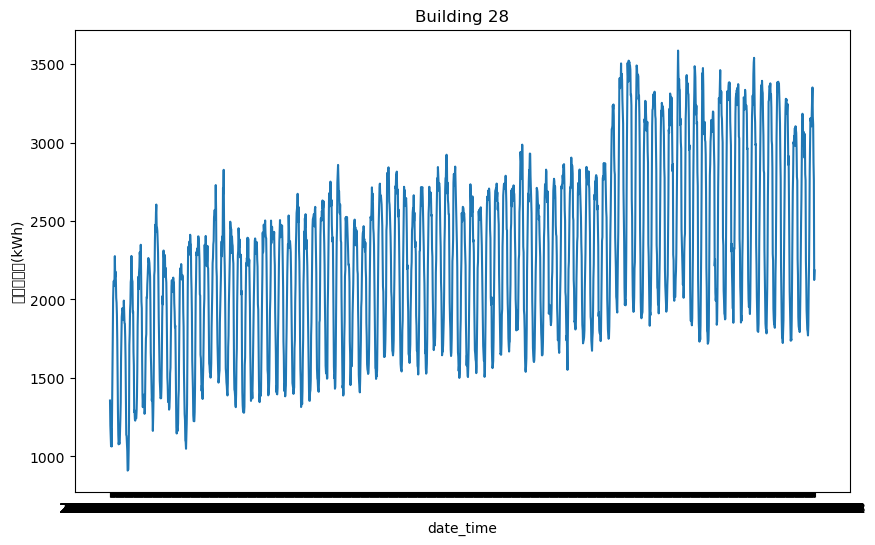

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

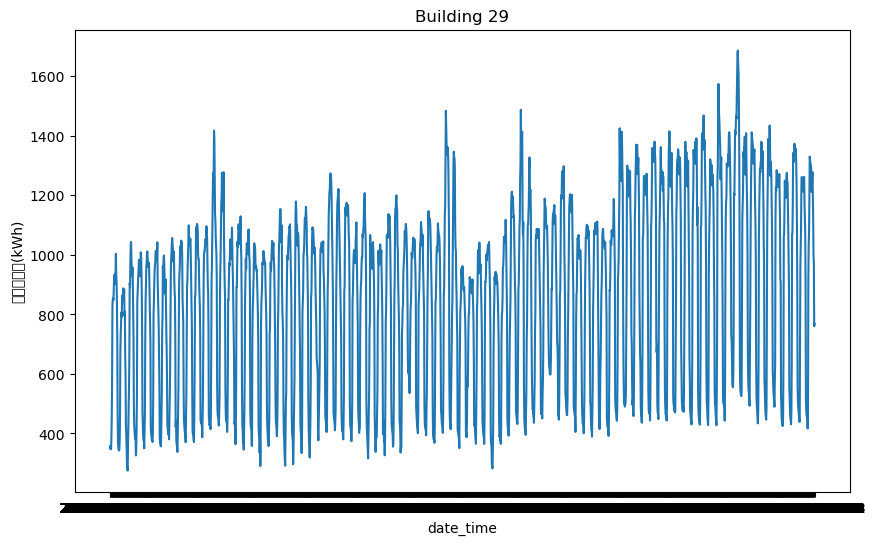

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

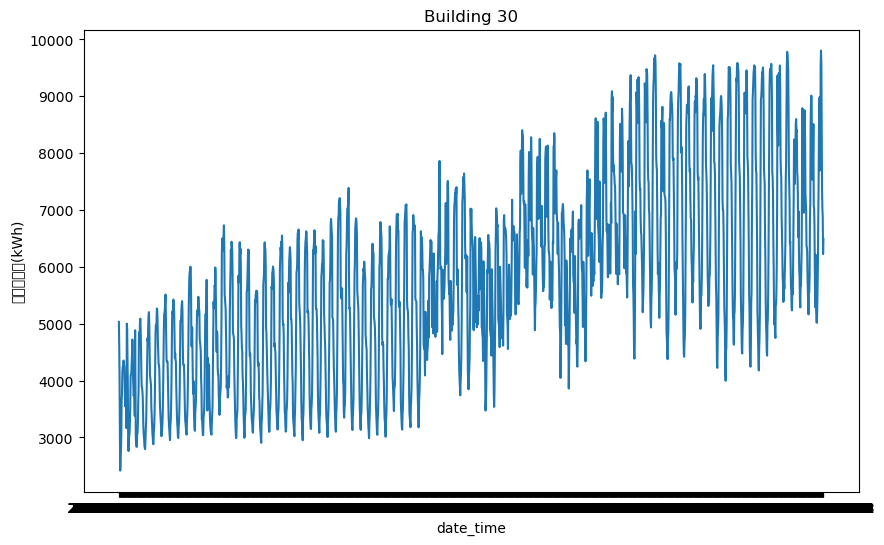

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

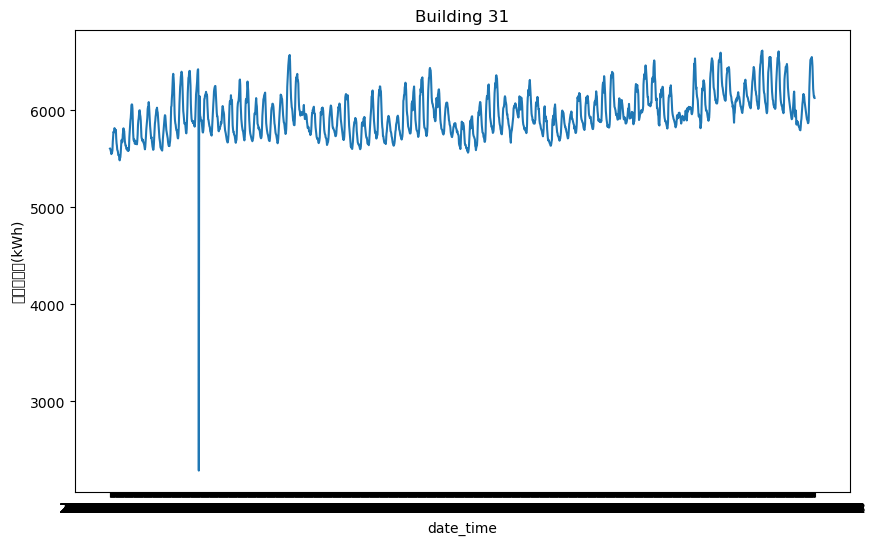

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

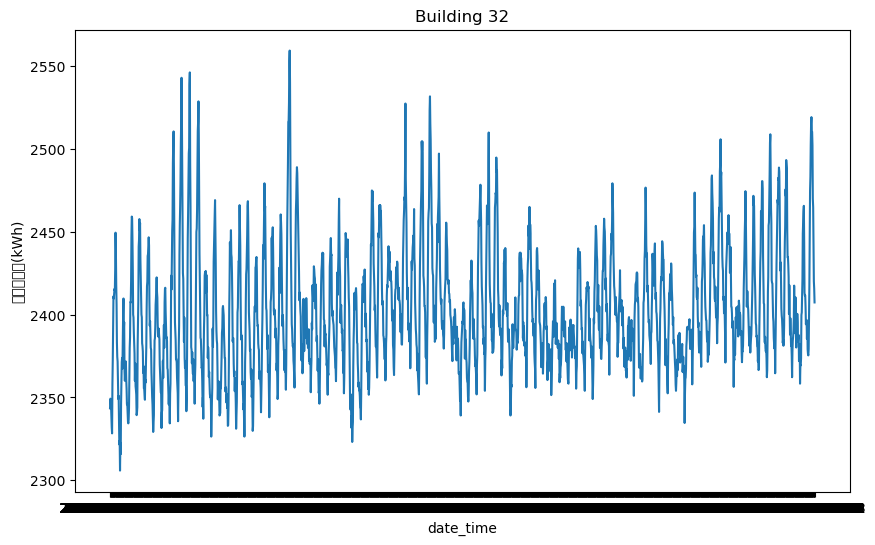

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

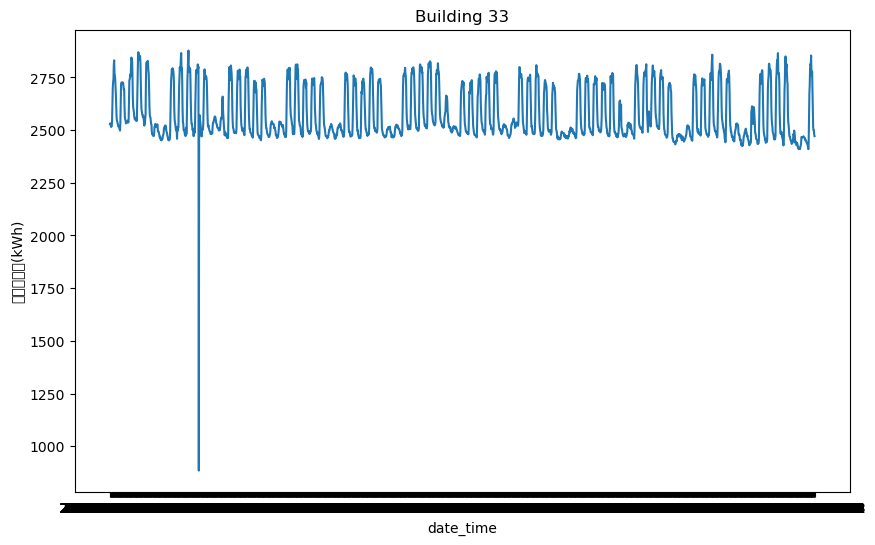

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

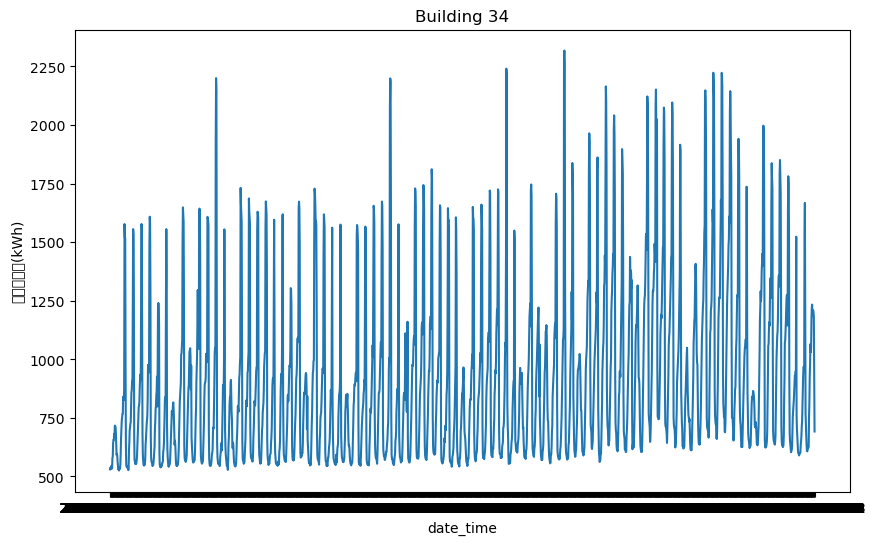

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

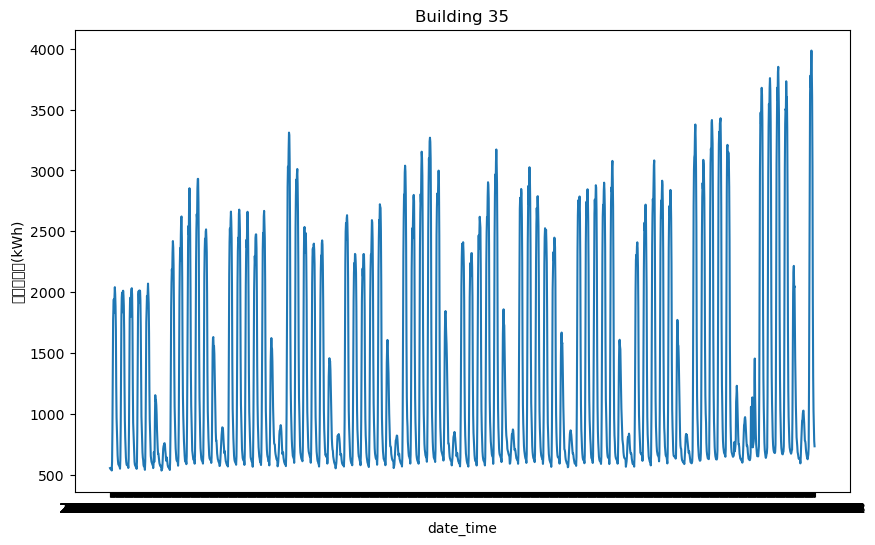

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

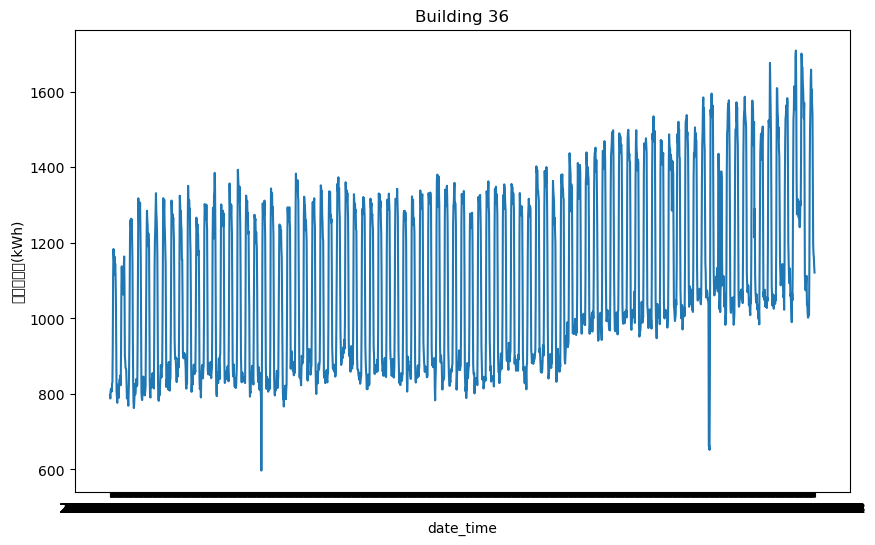

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

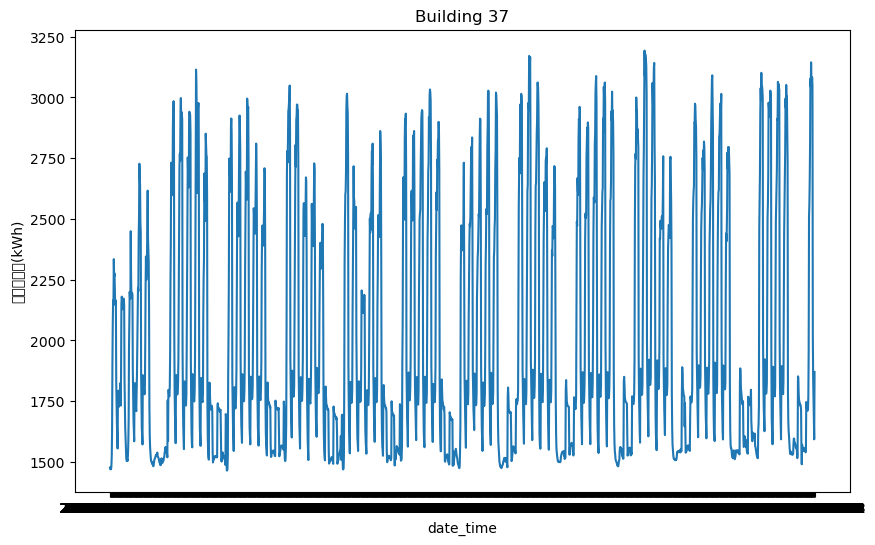

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

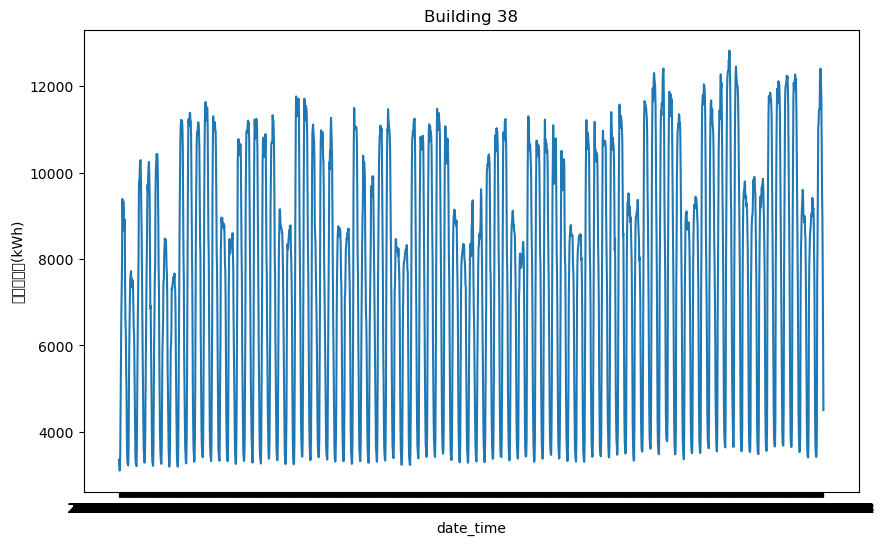

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

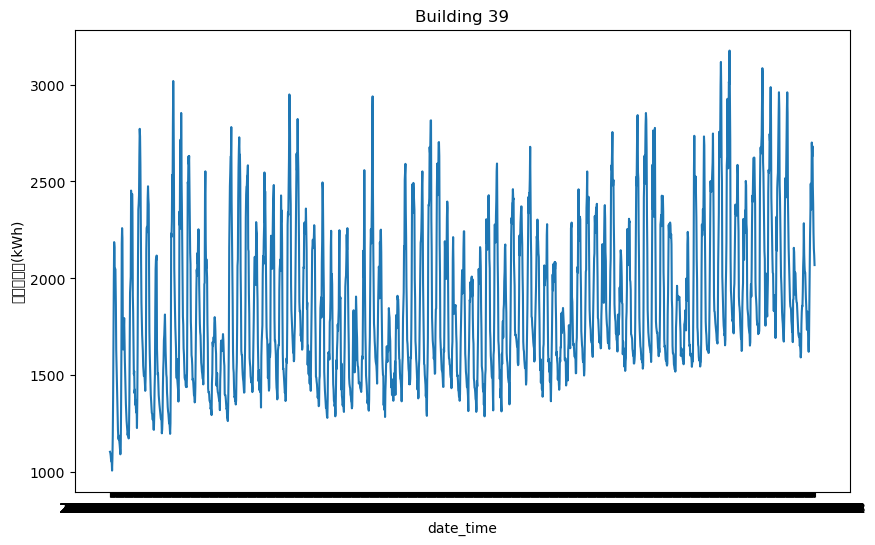

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

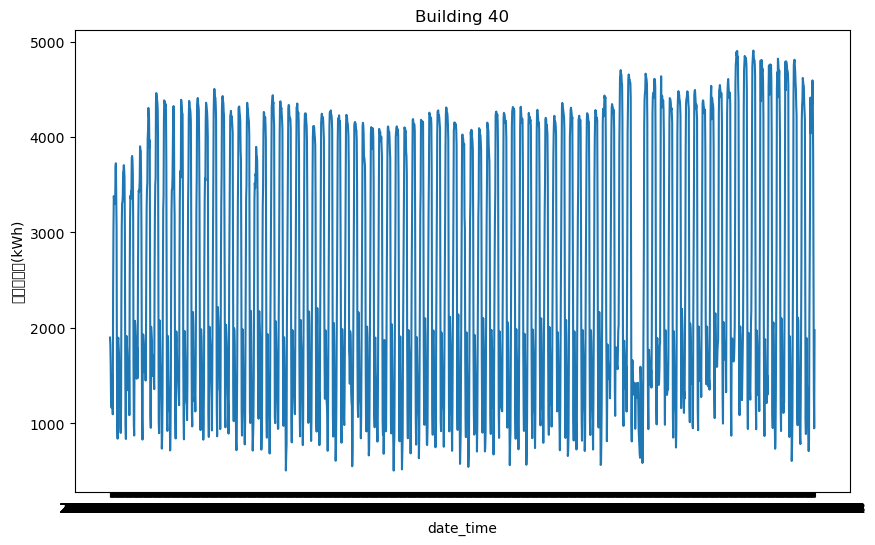

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

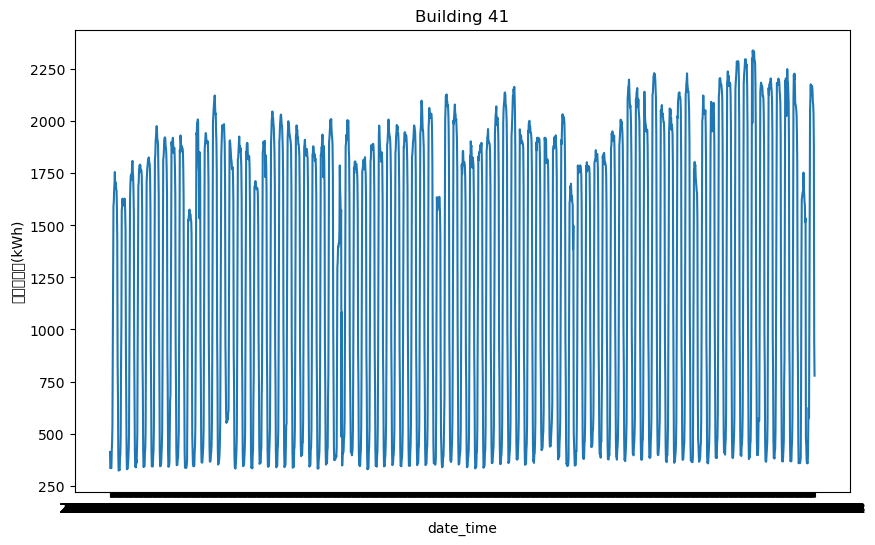

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

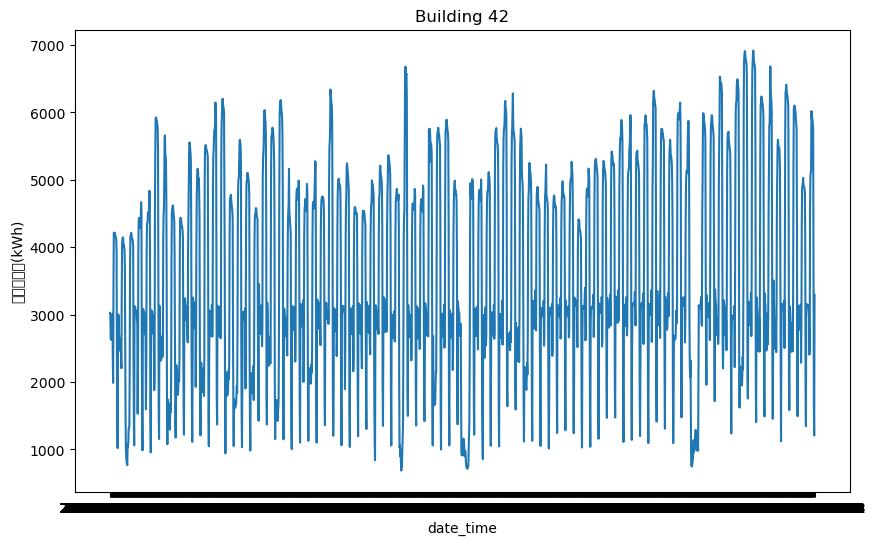

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

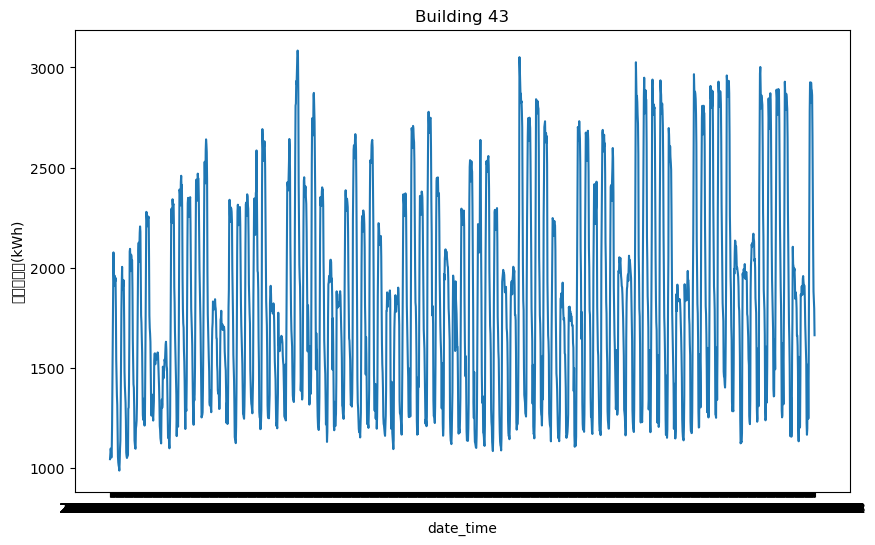

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

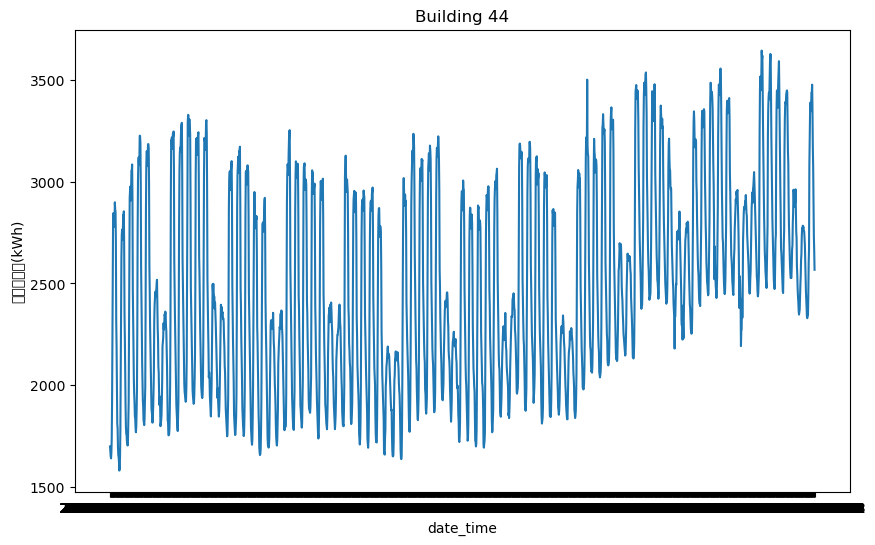

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

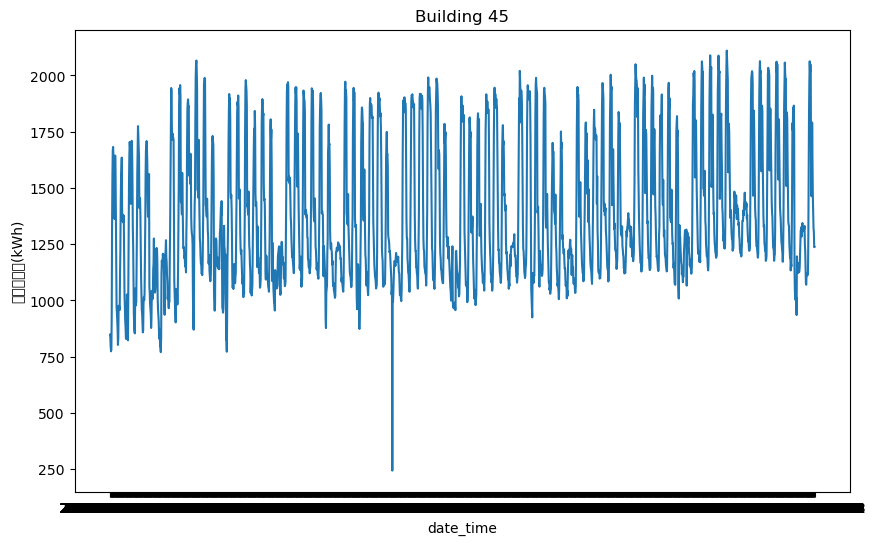

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

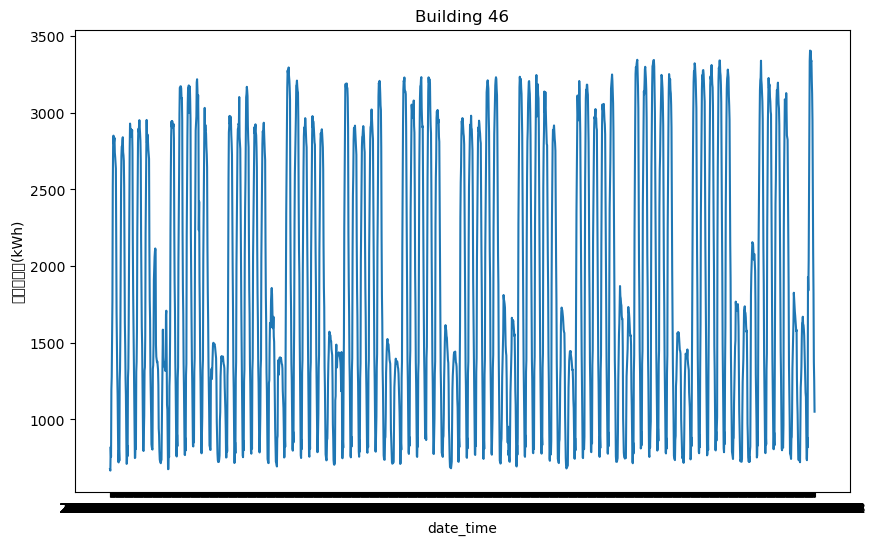

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

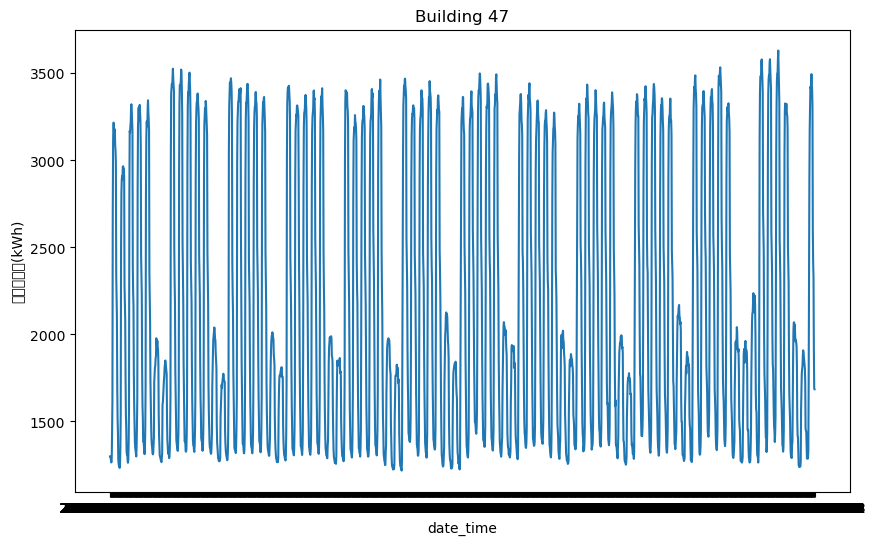

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

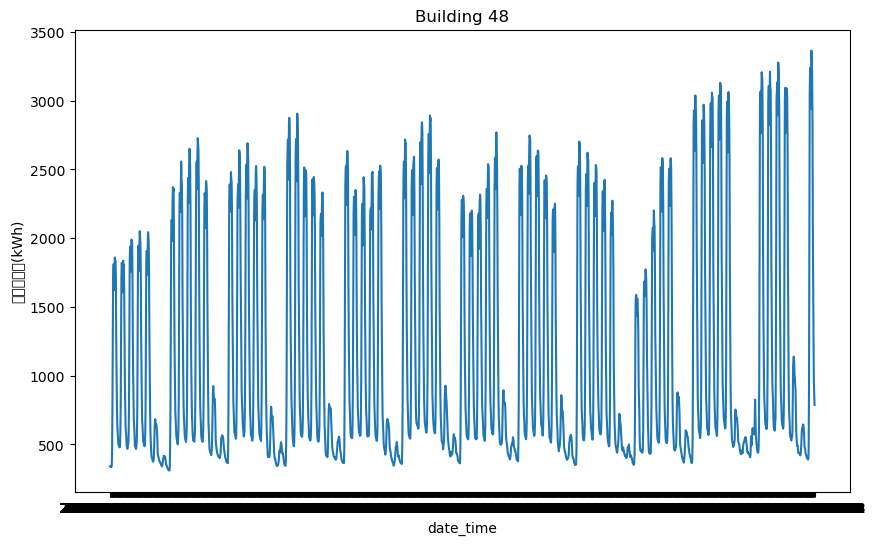

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

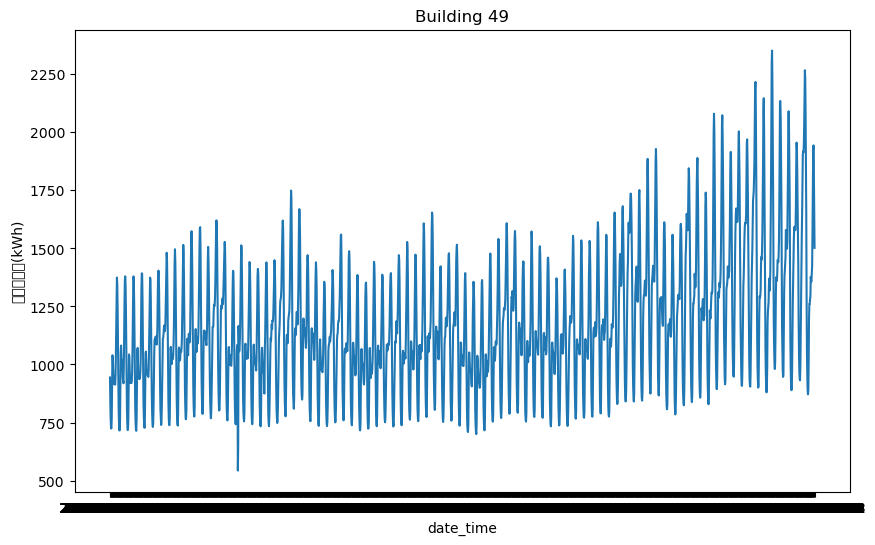

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

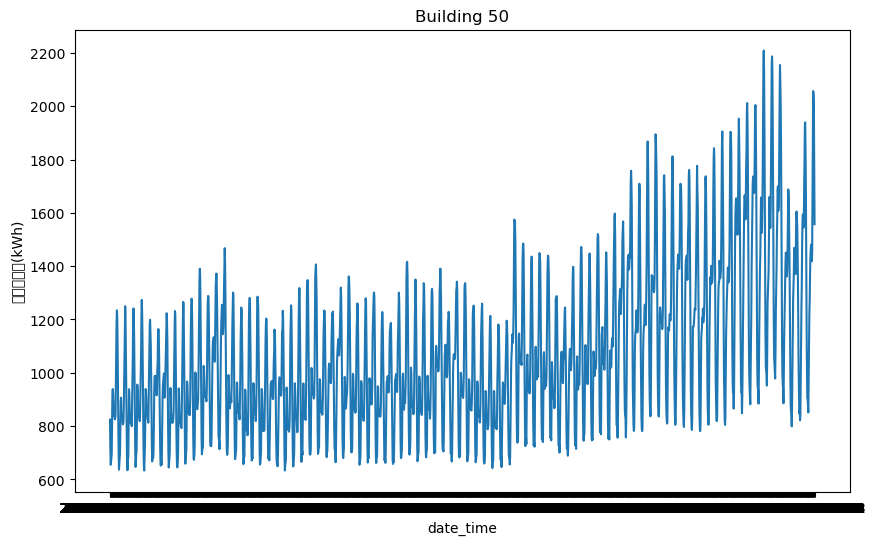

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

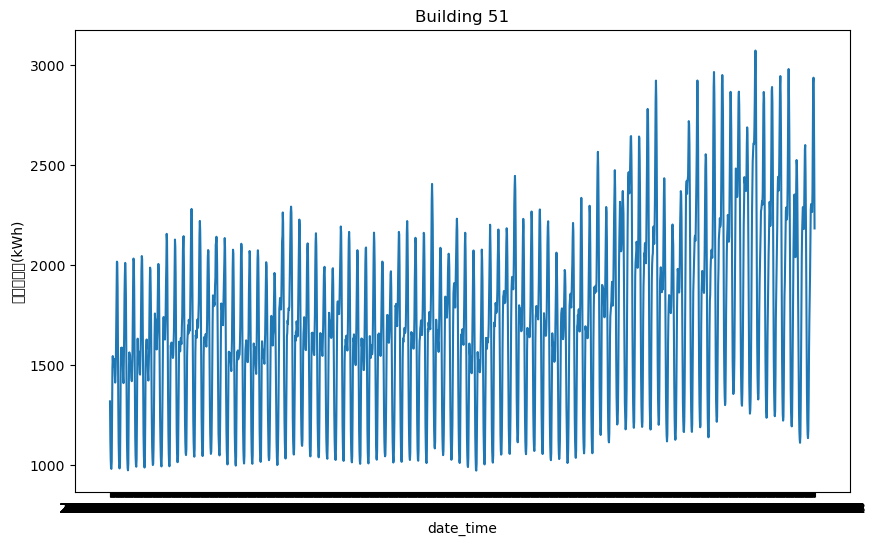

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

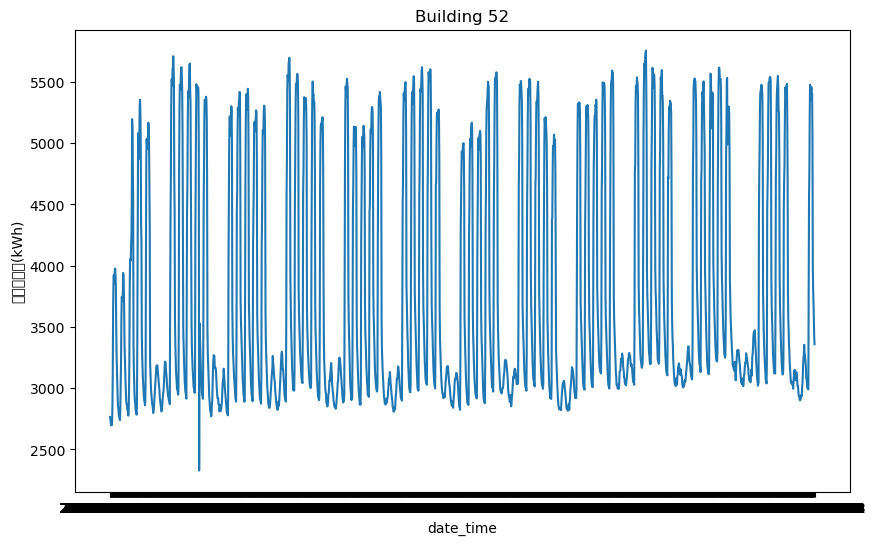

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

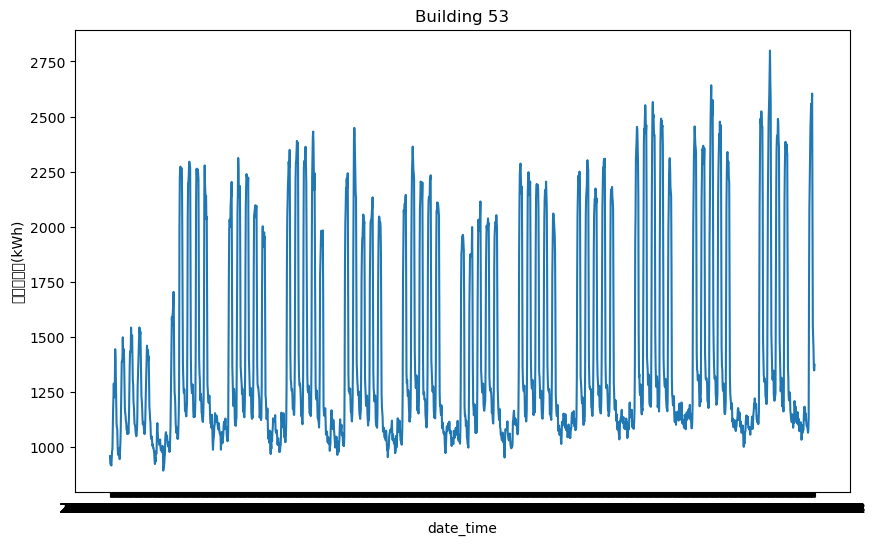

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

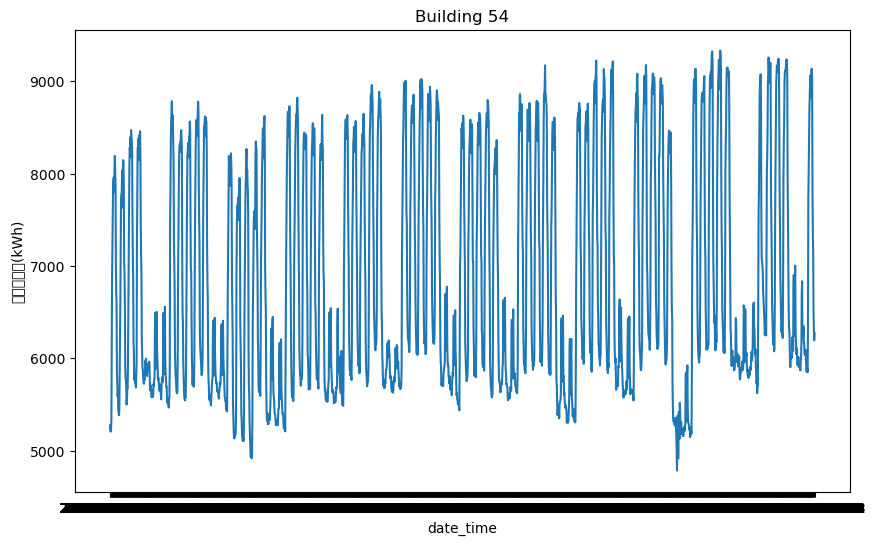

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

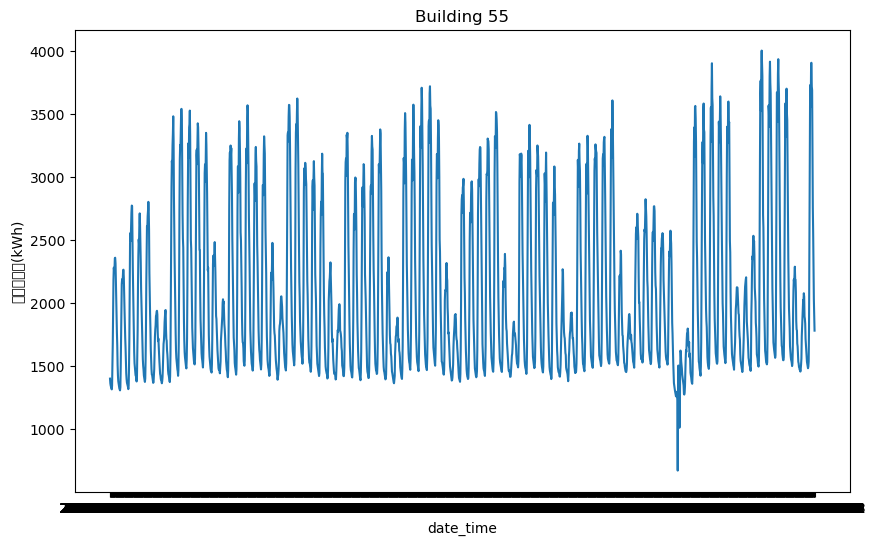

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

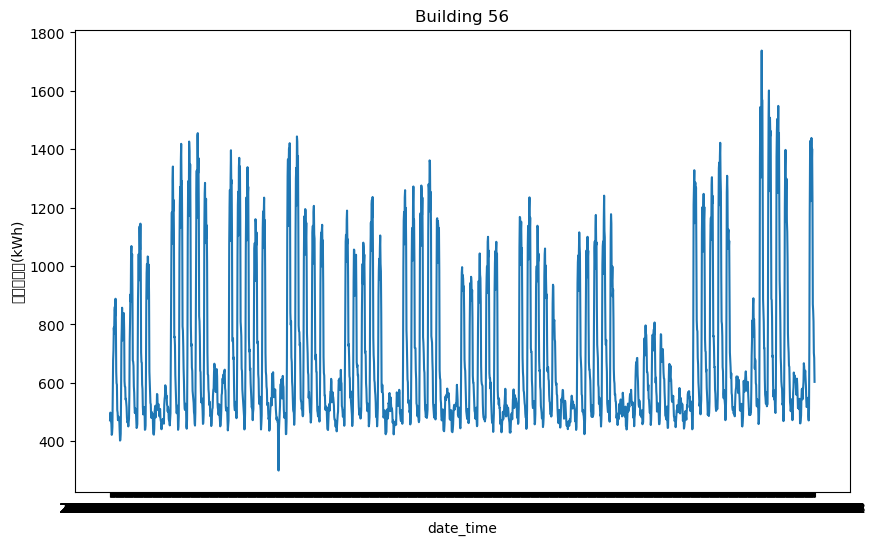

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

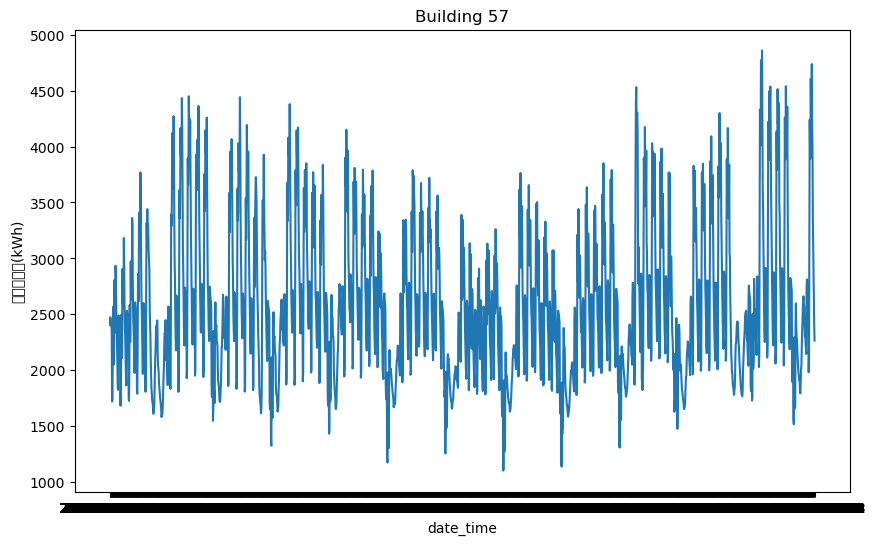

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

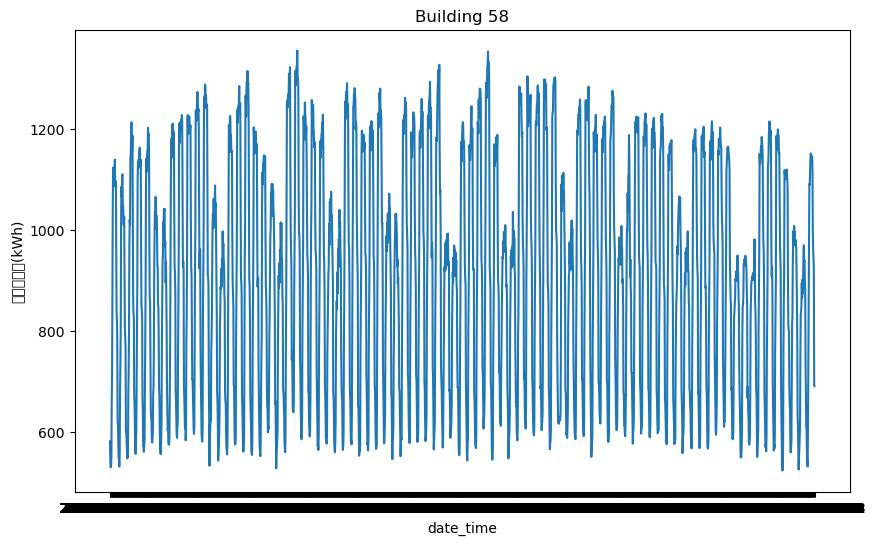

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

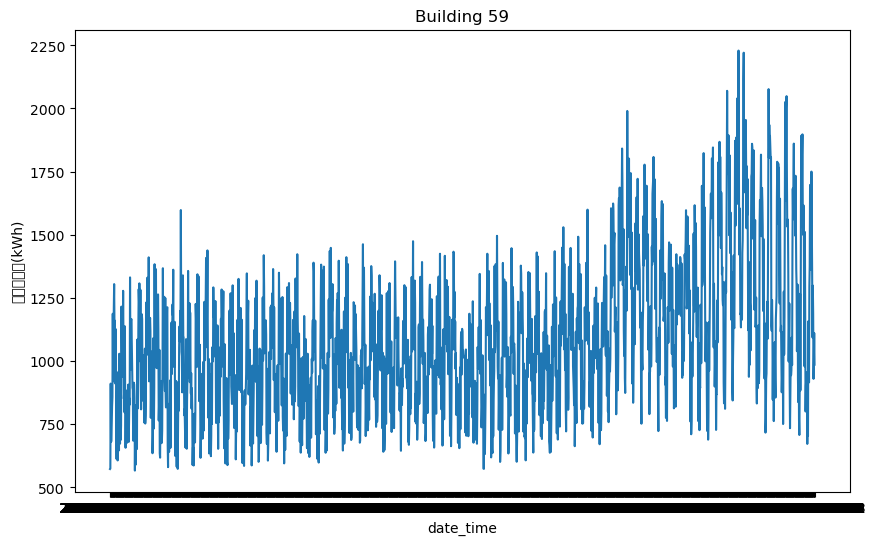

/var/folders/4h/b2cqm88s3cl_l0lpwl10b69r0000gn/T/ipykernel_26499/2535420410.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sainthm/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/sain

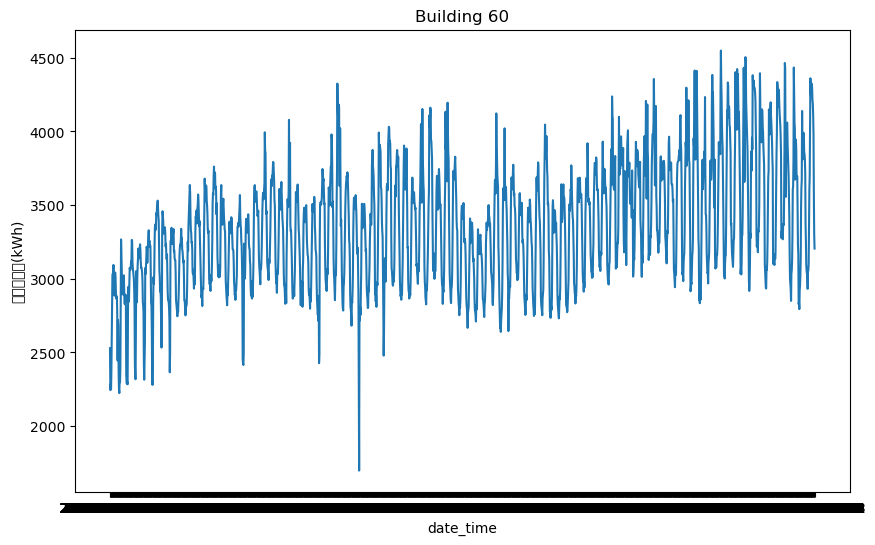

In [48]:
for n in range(1, 61):
    plt.figure(figsize=(10, 6))
    plt.title(f"Building {n}")
    sns.lineplot(data=train[train.num == n], x="date_time", y="전력사용량(kWh)", ci=None)
    plt.show()

In [55]:
train.date_tiem = pd.to_datetime(train.date_time)
test.date_tiem = pd.to_datetime(test.date_time)

In [56]:
train

,num,date_time,전력사용량(kWh),기온(°C),풍속(m/s),습도(%),강수량(mm),일조(hr),비전기냉방설비운영,태양광보유
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19,4114.368,27.8,2.3,68.0,0.0,0.7,1.0,1.0
122396,60,2020-08-24 20,3975.696,27.3,1.2,71.0,0.0,0.0,1.0,1.0
122397,60,2020-08-24 21,3572.208,27.3,1.8,71.0,0.0,0.0,1.0,1.0
122398,60,2020-08-24 22,3299.184,27.1,1.8,74.0,0.0,0.0,1.0,1.0


In [57]:
train.columns

Index(['num', 'date_time', '전력사용량(kWh)', '기온(°C)', '풍속(m/s)', '습도(%)',
       '강수량(mm)', '일조(hr)', '비전기냉방설비운영', '태양광보유'],
      dtype='object')

In [79]:
train.columns = ["num", "date_time", "target", "temperature", "windspeed", "humidity",
                "precipitation", "insolation", "elec_cool", "solar"]

test.columns = ["num", "date_time", "temperature", "windspeed", "humidity",
                "precipitation", "insolation", "elec_cool", "solar"]

In [60]:
train

,num,date_time,target,temperatur,windspeed,humidity,precipitation,insolation,elec_cool,solar
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19,4114.368,27.8,2.3,68.0,0.0,0.7,1.0,1.0
122396,60,2020-08-24 20,3975.696,27.3,1.2,71.0,0.0,0.0,1.0,1.0
122397,60,2020-08-24 21,3572.208,27.3,1.8,71.0,0.0,0.0,1.0,1.0
122398,60,2020-08-24 22,3299.184,27.1,1.8,74.0,0.0,0.0,1.0,1.0


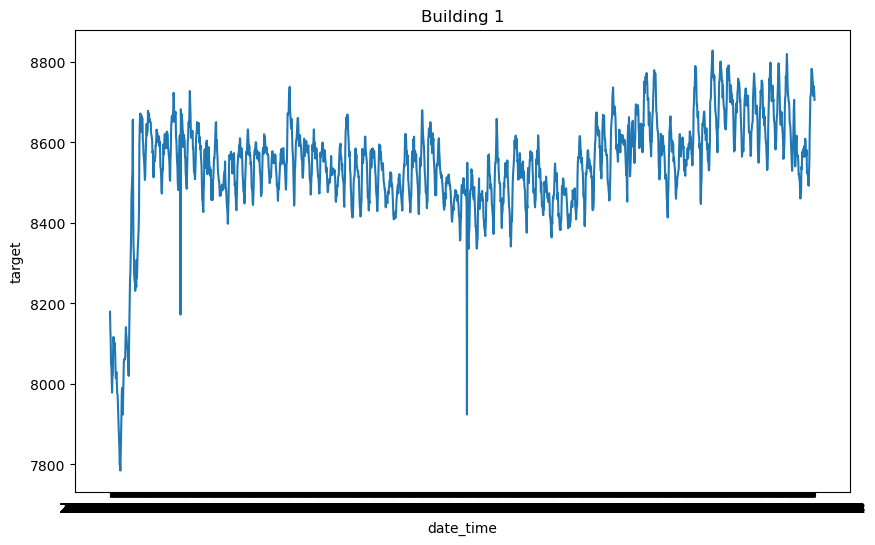

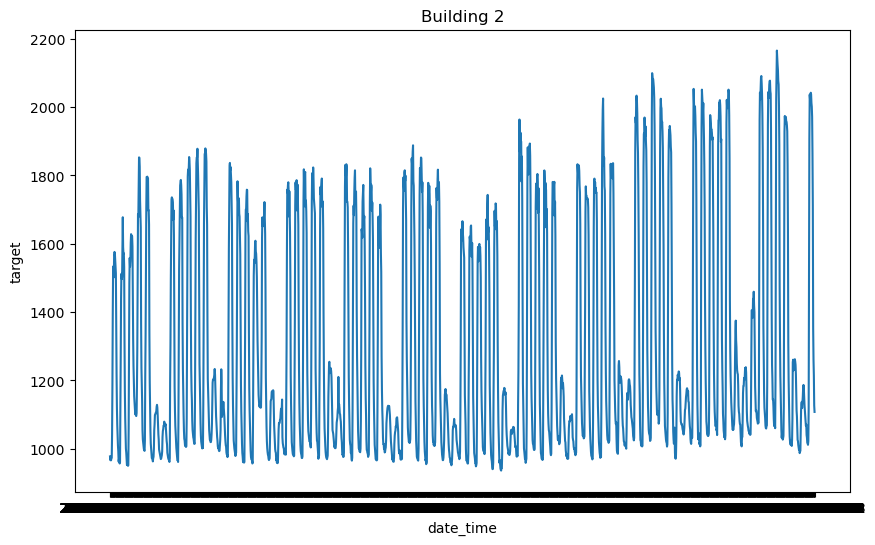

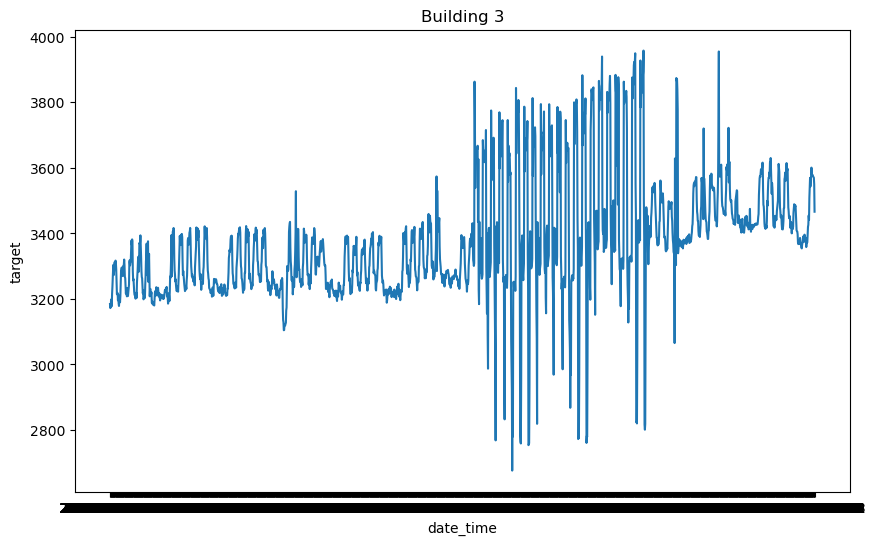

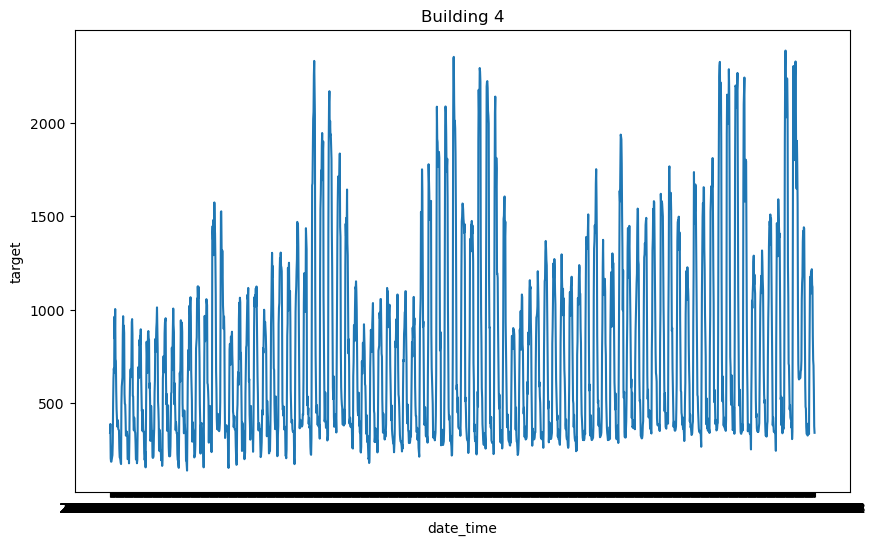

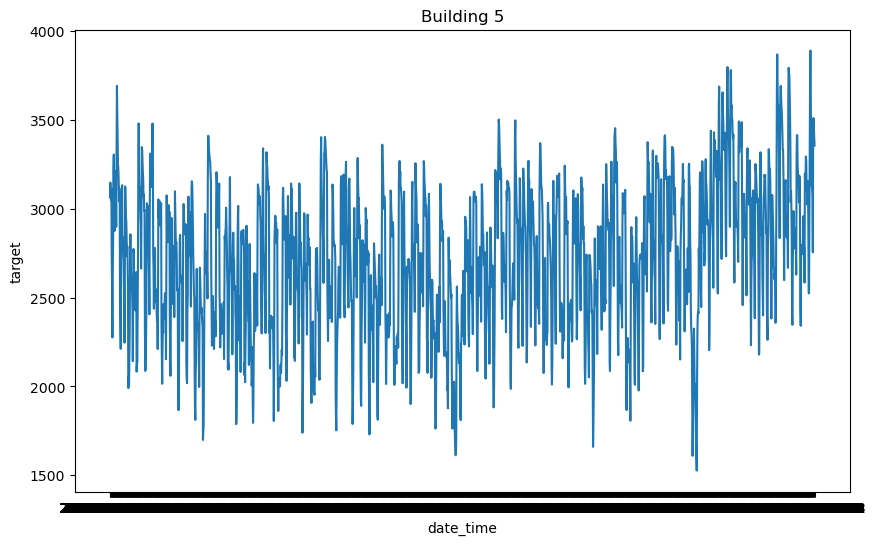

...

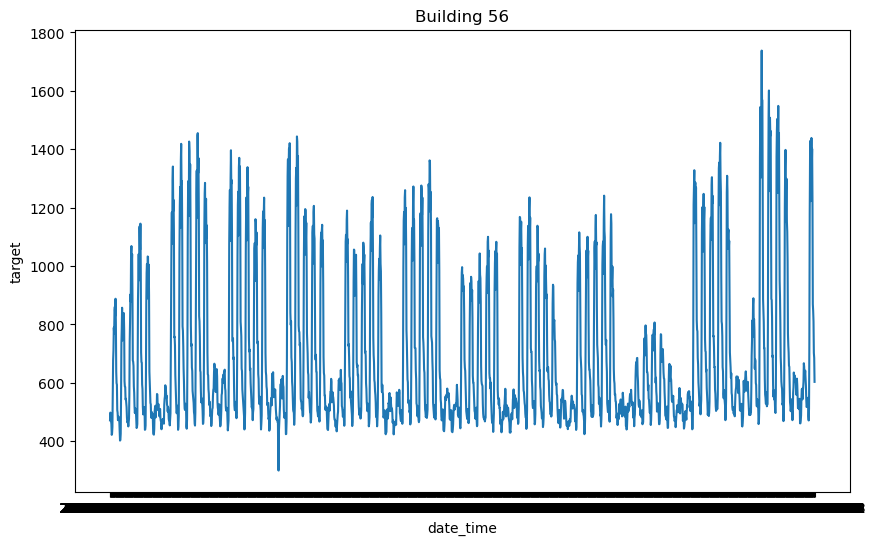

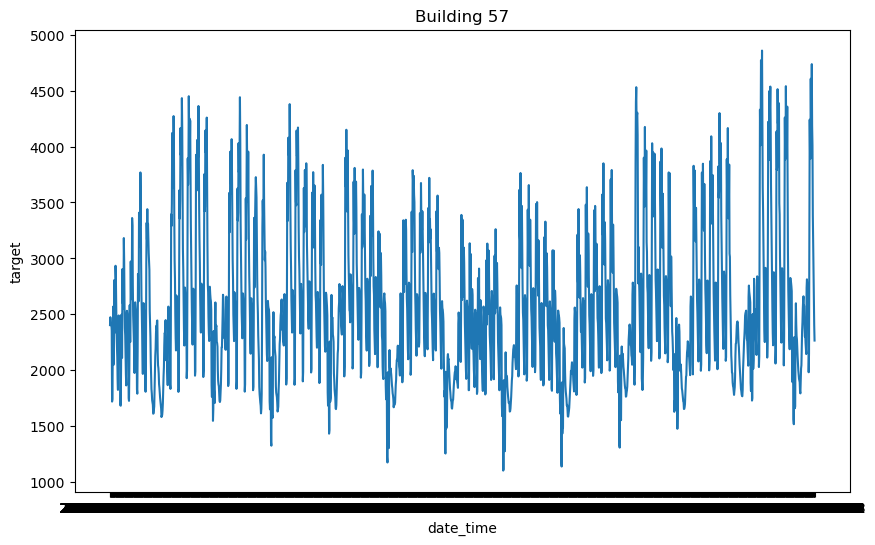

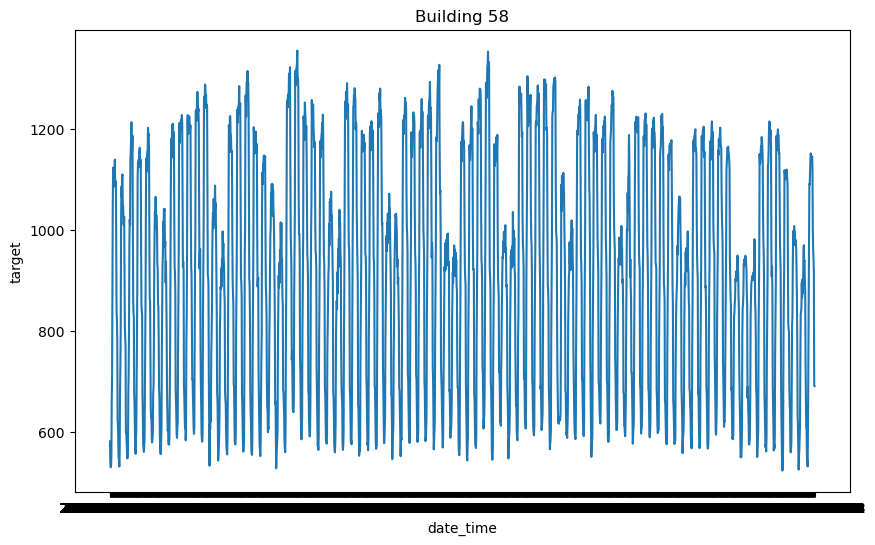

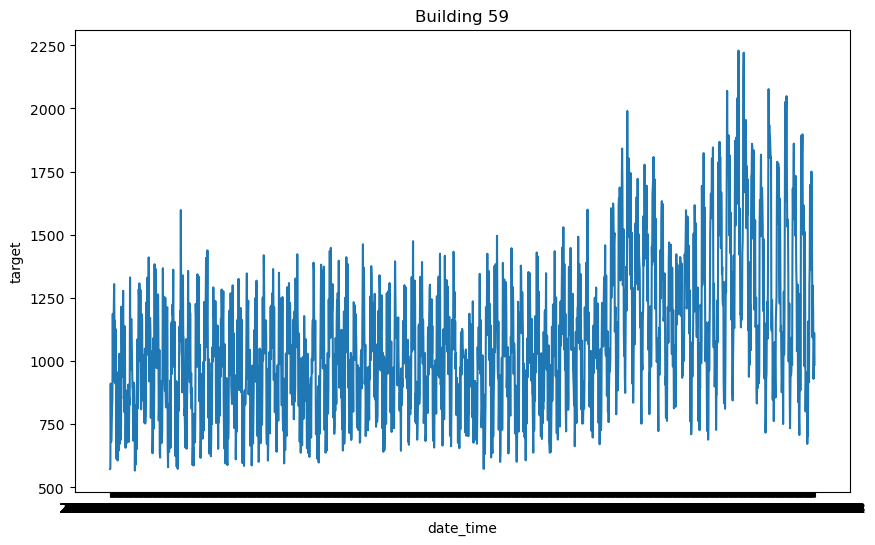

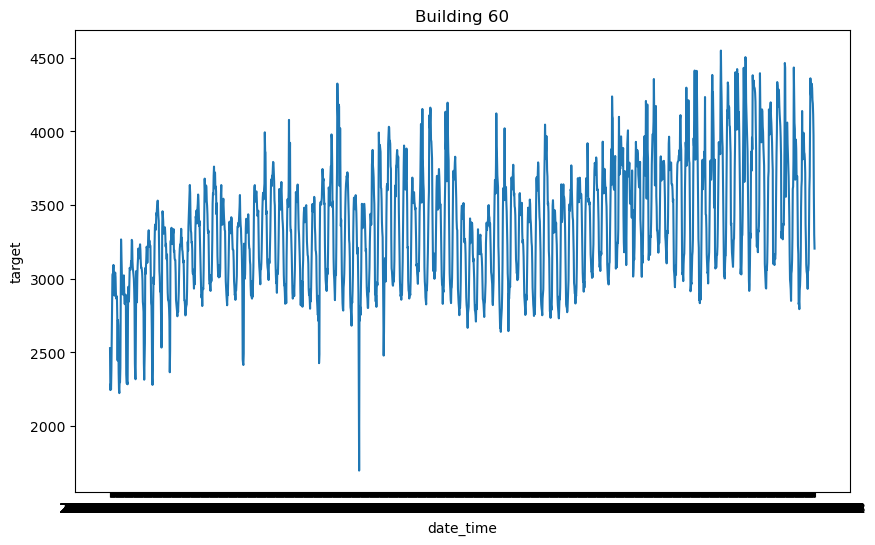

In [63]:
for n in range(1, 61):
    plt.figure(figsize=(10, 6))
    plt.title(f"Building {n}")
    sns.lineplot(data=train[train.num == n], x="date_time", y="target", errorbar=None)
    plt.show()

<AxesSubplot:xlabel='date_time', ylabel='temperature'>

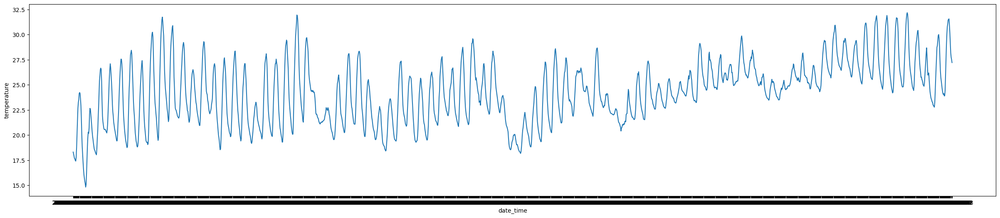

In [84]:
# test data 결측치 처리

# 1. 기상 정보들
plt.figure(figsize=(30, 6))
sns.lineplot(data=train, x="date_time", y="temperature", errorbar=None)
# sns.lineplot(data=test, x="date_time", y="temperature", errorbar=None)

<AxesSubplot:xlabel='date_time', ylabel='humidity'>

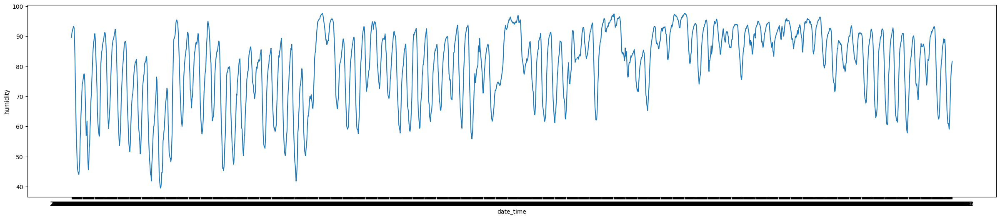

In [71]:
# humidity
plt.figure(figsize=(30, 6))
sns.lineplot(data=train, x="date_time", y="humidity", errorbar=None)

<AxesSubplot:xlabel='date_time', ylabel='temperature'>

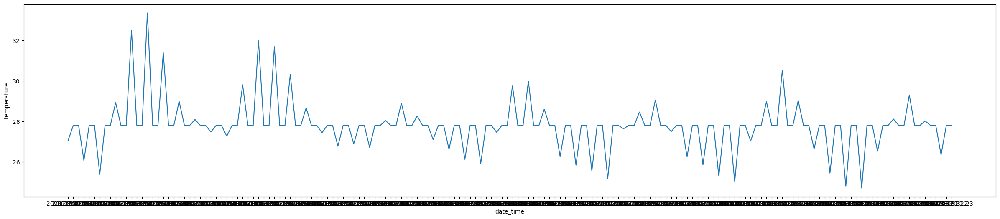

In [72]:
# 1. 기상 정보들
# 평균으로 다 그어버린 이상한 버전...🤣
plt.figure(figsize=(30, 6))
test.temperature = test.temperature.fillna(test.temperature.mean())
sns.lineplot(data=test, x="date_time", y="temperature", errorbar=None)


<AxesSubplot:xlabel='date_time', ylabel='precipitation'>

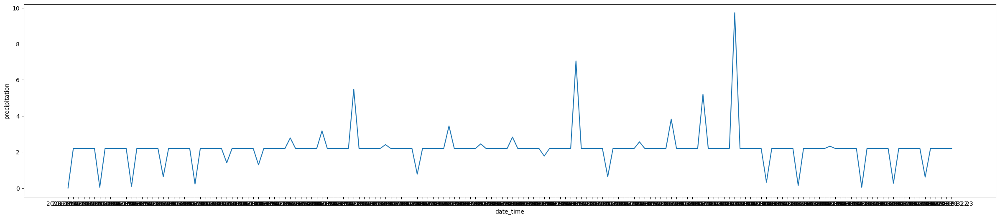

In [75]:
# 1. 기상 정보들
# 평균으로 다 그어버린 이상한 버전...🤣
plt.figure(figsize=(30, 6))
test.temperature = test.temperature.fillna(test.temperature.mean())
test.precipitation = test.precipitation.fillna(test.precipitation.mean())

sns.lineplot(data=test, x="date_time", y="precipitation", errorbar=None)


<AxesSubplot:xlabel='date_time', ylabel='precipitation'>

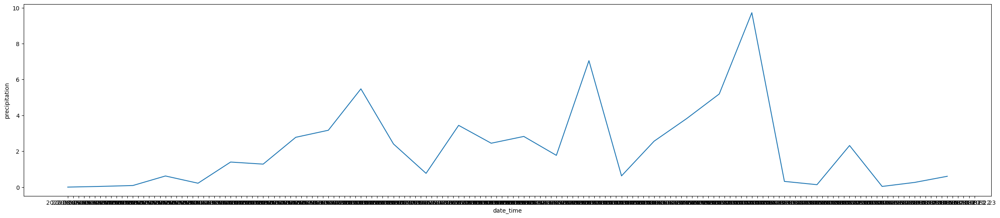

In [80]:
# linear interpolation!!
# 빈 값을 자연스럽게 채워주는 방식
plt.figure(figsize=(30, 6))
sns.lineplot(data=test, x="date_time", y="precipitation", errorbar=None)

In [81]:
test.temperature

0        27.8
1         NaN
2         NaN
3        27.3
4         NaN
         ... 
10075     NaN
10076     NaN
10077    27.9
10078     NaN
10079     NaN
Name: temperature, Length: 10080, dtype: float64

In [82]:
test.temperature.interpolate(method="linear")

0        27.800000
1        27.633333
2        27.466667
3        27.300000
4        26.900000
           ...    
10075    28.633333
10076    28.266667
10077    27.900000
10078    27.900000
10079    27.900000
Name: temperature, Length: 10080, dtype: float64

In [83]:
test.temperature = test.temperature.interpolate(method="linear")
test.humidity = test.humidity.interpolate(method="linear")
test.windspeed = test.windspeed.interpolate(method="linear")
test.insolation = test.insolation.interpolate(method="linear")
test.precipitation = test.precipitation.interpolate(method="linear")
train

,num,date_time,target,temperature,windspeed,humidity,precipitation,insolation,elec_cool,solar
0,1,2020-06-01 00,8179.056,17.6,2.5,92.0,0.8,0.0,0.0,0.0
1,1,2020-06-01 01,8135.640,17.7,2.9,91.0,0.3,0.0,0.0,0.0
2,1,2020-06-01 02,8107.128,17.5,3.2,91.0,0.0,0.0,0.0,0.0
3,1,2020-06-01 03,8048.808,17.1,3.2,91.0,0.0,0.0,0.0,0.0
4,1,2020-06-01 04,8043.624,17.0,3.3,92.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
122395,60,2020-08-24 19,4114.368,27.8,2.3,68.0,0.0,0.7,1.0,1.0
122396,60,2020-08-24 20,3975.696,27.3,1.2,71.0,0.0,0.0,1.0,1.0
122397,60,2020-08-24 21,3572.208,27.3,1.8,71.0,0.0,0.0,1.0,1.0
122398,60,2020-08-24 22,3299.184,27.1,1.8,74.0,0.0,0.0,1.0,1.0


In [85]:
# 2. 건물 정보들
test.elec_cool

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
10075    NaN
10076    NaN
10077    1.0
10078    NaN
10079    NaN
Name: elec_cool, Length: 10080, dtype: float64

In [86]:
test.solar

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
10075    NaN
10076    NaN
10077    1.0
10078    NaN
10079    NaN
Name: solar, Length: 10080, dtype: float64

In [95]:
# train에 있는 건물 별, 각 시간의 건물 정보를 그대로 쓸 수 있지 않을까?

## To-Do
## 1) train에 있는 각 건물 별로 elec_cool_flag와 solar가 같은지 체크
# 아무것도 없으면 통과!
for n in train.num.unique():
    if len(train[train.num == n].elec_cool.unique()) == 1 and len(train[train.num == n].solar.unique()) == 1:
        continue
    else:
        print("Different!")
        break

## 2) 같다면, test data에 같은 건물 번호를 가지는 데이터에 연결
building_info = train[["num", "elec_cool", "solar"]].drop_duplicates()
# pd.merge(test, building_info, on="num") # 뭔가 좀 이상함.. x, y가 생김
test = pd.merge(test.drop(columns=["elec_cool", "solar"]), building_info, on="num") # 뭔가 좀 이상함.. x, y가 생김
test

,num,date_time,temperature,windspeed,humidity,precipitation,insolation,elec_cool,solar
0,1,2020-08-25 00,27.800000,1.500000,74.000000,0.0,0.000000,0.0,0.0
1,1,2020-08-25 01,27.633333,1.366667,75.333333,0.0,0.000000,0.0,0.0
2,1,2020-08-25 02,27.466667,1.233333,76.666667,0.0,0.000000,0.0,0.0
3,1,2020-08-25 03,27.300000,1.100000,78.000000,0.0,0.000000,0.0,0.0
4,1,2020-08-25 04,26.900000,1.166667,79.666667,0.0,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...
10075,60,2020-08-31 19,28.633333,3.566667,66.000000,0.0,0.533333,1.0,1.0
10076,60,2020-08-31 20,28.266667,3.833333,67.000000,0.0,0.266667,1.0,1.0
10077,60,2020-08-31 21,27.900000,4.100000,68.000000,0.0,0.000000,1.0,1.0
10078,60,2020-08-31 22,27.900000,4.100000,68.000000,0.0,0.000000,1.0,1.0
